# Imports, etc

In [1]:
from importlib import reload

import os
import numpy as np

%matplotlib widget
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
from pfs.drp.stella.utils.asinhNorm import AsinhNorm   # actually from matplotlib if >~ 3.6.0

plt.rcParams['figure.figsize'] = (9, 7)
plt.rcParams["image.interpolation"] = None
from IPython.display import display, HTML
display(HTML("<style>.container { width:99% !important; }</style>"))

/tmp/ipykernel_120492/605920254.py:12: MatplotlibDeprecationWarning: Support for setting an rcParam that expects a str value to a non-str value is deprecated since 3.5 and support will be removed two minor releases later.
  plt.rcParams["image.interpolation"] = None


In [294]:
# Show non-stack versions/packages
import sys
[p for p in sys.path if p.find('stack_INFRA') < 0]

['/work/cloomis/notebooks',
 '/usr/local/jupyterhub/jupyterhub-python-3.8/envs/matplotlib',
 '/work/cloomis/devel/drp_stella/python',
 '/software/mhs/products/Linux64/pfs_instdata/1.6.13/python',
 '/software/devel/pfs/ics_cobraCharmer/python',
 '']

In [3]:
import lsst.daf.persistence as dafPersist
from pfs.datamodel.pfsConfig import PfsConfig, FiberStatus, TargetType
import pfs.drp.stella.utils.raster as raster

import lsst.afw.display as afwDisplay

In [4]:
# work around old(?) versions of astropy
from astropy.utils import iers
iers.conf.auto_max_age = None  
iers.conf.iers_degraded_accuracy = 'warn' if True else 'ignore'

## Wrap pfs_utils distortion fitter.

In [254]:
import pfs.utils.coordinates.transform 
import scipy

pfs.utils.coordinates.transform = reload(pfs.utils.coordinates.transform)

MeasureDistortion = pfs.utils.coordinates.transform.MeasureDistortion
    
class MeasureXYRot(MeasureDistortion):
    def __init__(self, x, y, xoff, yoff, nsigma=5, alphaRot=0.0):
        """x, y: measured positions in pfi coordinates (mm)
        xoff, yoff: measured offsets (microns)
        nsigma: clip the fitting at this many standard deviations (None => 5).  No clipping if <= 0
        alphaRot: coefficient for the dtheta^2 term in the penalty function
        """
        self.nsigma = 5 if nsigma is None else nsigma
        self.alphaRot = alphaRot

        good = np.isfinite(x + y + xoff + yoff)

        self.x = x[good]
        self.y = y[good]

        self.xtrue = (x + 1e-3*xoff)[good]
        self.ytrue = (y + 1e-3*yoff)[good]
        #
        # The correct number of initial values; must match code in __call__()
        #
        x0, y0, theta, dscale, scale2 = np.array([0, 0, 0, 0, 0], dtype=float)
        self._args = np.array([x0, y0, theta, dscale, scale2])
        self.frozen = np.zeros(len(self._args), dtype=bool)

    def __call__(self, args):
        tx, ty = self.distort(self.x, self.y, *args)

        d = np.hypot(tx - self.xtrue, ty - self.ytrue)

        if self.nsigma > 0:
            d = d[self.clip(d, self.nsigma)]

        penalty = penalty0 = np.sum(d**2)
        penalty += self.alphaRot*(args[2] - 0.0)**2 # include a prior on the rotation, args[2]

        # print(f'args={args} {penalty0} {penalty}')
        return penalty

# paths, reruns, etc

In [207]:
conn = None   # database connection

if True and os.path.exists("/work/drp"):
    calibName = "CALIB"
    base, rerun = "/work/drp", "cpl/2023-04"
else:
    calibName = "CALIB-20220630"
    base, rerun = "/work/cpl", "cpl/2022-11"
    
calibRoot = f"/work/drp/{calibName}"
pfsDesignDir = "/data/pfsDesign"
    
import psycopg2
import pandas as pd
conn = psycopg2.connect("dbname='opdb' host='pfsa-db01' port=5432 user='pfs'") 
dataDir = os.path.join(base, "rerun", rerun)

print(dataDir, calibRoot)
butler = dafPersist.Butler(dataDir, calibRoot=calibRoot)

try:
    afwDisplay.setDefaultBackend("matplotlib")
except RuntimeError:
    pass

dataId = dict(spectrograph=3, arm="r", visit=81998)

/work/drp/rerun/cpl/2023-04 /work/drp/CALIB
lsst.CameraMapper INFO: Loading exposure registry from /work/drp/registry.pgsql
lsst.CameraMapper INFO: Loading calib registry from /work/drp/CALIB/calibRegistry.sqlite3
lsst.CameraMapper INFO: Loading calib registry from /work/drp/CALIB/calibRegistry.sqlite3


In [322]:
dataDir

'/work/drp/rerun/cpl/2023-04'

In [208]:
if os.path.exists("/work/drp"):
    repoRoot = "/work/drp"
    calibRoot = os.path.join(repoRoot, calibName)
    rerun = f'drpActor/{calibName}'

    drpButler = dafPersist.Butler(os.path.join(repoRoot, 'rerun', rerun), 
                                  calibRoot=os.path.join(repoRoot, calibName))
else:
    drpButler = butler

lsst.CameraMapper INFO: Loading exposure registry from /work/drp/registry.pgsql
lsst.CameraMapper INFO: Loading calib registry from /work/drp/CALIB/calibRegistry.sqlite3
lsst.CameraMapper INFO: Loading calib registry from /work/drp/CALIB/calibRegistry.sqlite3


## Read needed data (common to all exposures)

In [209]:
try:
    fiberTraces
except NameError:
    fiberTraces = {}

if not dataId['arm'] in fiberTraces:
    for sm in 1,3:
        for a in "br":
            fiberProfiles = butler.get("fiberProfiles", dataId, arm=a, spectrograph=sm)
            detectorMap = butler.get("detectorMap", dataId, arm=a, spectrograph=sm)
            cam = f'{a}{sm}'
            fiberTraces[cam] = fiberProfiles.makeFiberTracesFromDetectorMap(detectorMap)
        del fiberProfiles
        
camera = butler.get("camera")

In [210]:
fiberTraces

{'b1': <pfs.drp.stella.FiberTraceSet.FiberTraceSet at 0x7fc572c31df0>,
 'r1': <pfs.drp.stella.FiberTraceSet.FiberTraceSet at 0x7fc572c03db0>,
 'b3': <pfs.drp.stella.FiberTraceSet.FiberTraceSet at 0x7fc572bec3f0>,
 'r3': <pfs.drp.stella.FiberTraceSet.FiberTraceSet at 0x7fc572ab34f0>}

In [211]:
import pfs.utils
reload(pfs.utils)

import pfs.utils.butler as icsButler
from pfs.utils.fiberids import FiberIds


In [212]:
import pfs.utils
reload(pfs.utils)

import pfs.utils.butler as icsButler
from pfs.utils.fiberids import FiberIds

try:
    pbutler
except NameError:
    pbutler = None

if pbutler is None:
    try:
        pbutler = icsButler.Butler()
    except Exception as e:
        print(e)
        pfi = None
    else:
        pfi = pbutler.get('moduleXml', moduleName='ALL', version='')

gfm = FiberIds()

In [299]:
pfsConfig = butler.get("pfsConfig", dataId)
l = (pfsConfig.spectrograph == 1) | (pfsConfig.spectrograph == 3)

pfsConfig = pfsConfig[np.logical_and(l, pfsConfig.targetType != TargetType.ENGINEERING)]

In [300]:
len(pfsConfig)

1197

### Grab wavelength range once.

In [334]:
#
reload(raster)
dataId.update(arm='r', visit=91115)

#
# specify windowing and convert to wavelength range usable with all fibres
#
md = butler.get("raw_md", dataId)

row0, row1 = md["W_CDROW0"], md["W_CDROWN"]
dataY0 = butler.get("camera", dataId)[0][0].getRawDataBBox().getBeginY()  # first usable row of data (after dropping region near serials)

nrows = row1 - row0 + 1
row0 += dataY0    # row0/row1 are in raw pixels, but we drop the first dataY0 rows in the ISR processing

lmin, lmax = raster.getWindowedSpectralRange(row0, nrows, butler, dataId)
lmin, lmax = np.ceil(lmin), np.floor(lmax)
lmin,lmax

(624.0, 986.0)

## Calculate the crosstalk coefficients.  


If you don't want to run this, set `icrosstalk = None`

In [14]:
if True:
    icrosstalk = None
else:
    calculateCrosstalkCoeffs = False
    try:
        fluxes
    except NameError:
        calculateCrosstalkCoeffs = True

    if calculateCrosstalkCoeffs:
        #
        # Estimate the optical cross talk from a bright object in a given fibre
        #
        nCCoeffs = 5  # number of coefficients
        visit, fiberId = 78454, 586

        dataId.update(visit=visit)

        pfsConfig = butler.get('pfsConfig', dataId)
        pfsConfig = pfsConfig[pfsConfig.spectrograph == dataId["spectrograph"]]

        spec = butler.get('pfsArm', dataId)
        spec = spec[pfsConfig.targetType != TargetType.ENGINEERING]
        pfsConfig = pfsConfig[pfsConfig.targetType != TargetType.ENGINEERING]

        spec.flux[spec.mask != 0x0] = np.NaN

        fluxes = np.nanmedian(spec.flux, axis=1)
        fluxes -= np.nanmedian(fluxes)

        foo = fluxes/np.nanmax(fluxes)
        foo = foo[np.abs(pfsConfig.fiberId - fiberId) <= nCCoeffs]
        c = np.empty(nCCoeffs)

        for i in range(nCCoeffs):
            c[i] = (foo[nCCoeffs - i] + foo[nCCoeffs + i])/2
    else:
        c = np.array([1.00000000e+00, 4.41695363e-03, 1.26907573e-03, 6.37238677e-04, 3.99808286e-04])

    n = len(fluxes)
    crosstalk = np.zeros((n, n))
    I, J = np.meshgrid(np.arange(n), np.arange(n))
    for i in range(len(c)):
        crosstalk[np.abs(I - J) == i] = c[i]

    icrosstalk = np.linalg.inv(crosstalk)

# Define the data that we're going to show.

This takes much longer than it should.  Investigate.

## Create a single dataset manager.

In [42]:
import ditherSets
reload(raster)
reload(ditherSets)

ditherCfg = ditherSets.DitherConfig(drpButler, conn, 
                                    fiberTraces=fiberTraces,
                                    dataId=dataId, camera=camera,
                                    lmin=lmin, lmax=lmax)
# del ditherColl
try:
    oldDithers = ditherColl
    ditherColl = ditherSets.DitherSets(ditherCfg, loadFrom=oldDithers)
except NameError:
    ditherColl = ditherSets.DitherSets(ditherCfg)
    
print(ditherColl)

DitherSet("[]"


## 2023-04-21 dithers

In [340]:
list(range(91096, 91096+8))

[91096, 91097, 91098, 91099, 91100, 91101, 91102, 91103]

In [335]:
ditherColl.newDitherSet('m44_1', visits=list(range(91075, 91075+9)), comment='blowing nose test')

ditherColl.newDitherSet('m44_2_v1_focus0', visits=list(range(91085, 91085+2)), comment='focus=3.27')
ditherColl.newDitherSet('m44_2_v1_focus-100', visits=list(range(91087, 91087+2)), comment='focus=3.17')
ditherColl.newDitherSet('m44_2_v1_focus+100', visits=list(range(91089, 91089+2)), comment='focus=3.37')
ditherColl.newDitherSet('m44_2_v1_focus+50', visits=list(range(91091, 91091+2)), comment='focus=3.32')
ditherColl.newDitherSet('m44_2_v1_focus-50', visits=list(range(91093, 91093+2)), comment='focus=3.22')

ditherColl.newDitherSet('sky_14_15_3_v0', visits=list(range(91096, 91096+9)), comment='AG offsets only')

ditherColl.newDitherSet('col256_1', visits=list(range(91130, 91130+8)), comment='')

ditherColl.newDitherSet('sky_15_35_1', visits=list(range(91139, 91139+9)), comment='')
ditherColl.newDitherSet('sky_15_35_2', visits=list(range(91149, 91149+9)), comment='repeat due to sky conditions')
ditherColl.newDitherSet('ngc6791_1', visits=list(range(91159, 91159+9)), comment='')


ditherSet m44_1 exists, not overwriting
ditherSet m44_2_v1_focus0 exists, not overwriting
ditherSet m44_2_v1_focus-100 exists, not overwriting
ditherSet m44_2_v1_focus+100 exists, not overwriting
ditherSet m44_2_v1_focus+50 exists, not overwriting
ditherSet m44_2_v1_focus-50 exists, not overwriting
ditherSet sky_14_15_3_v0 exists, not overwriting


# Load dither sets

The basic data convention is that the single `ditherColl` contains a dict of ditherSets, which basically cache stuff: the raw pfsArms, poststamp images, etc. We *expect* to add more data and logic, as needed.

Many cells expect a global `dset`, which is just a shorthand for, say, `dset = ditherColl.ditherSets['m34_1']`. A few also expect `dither`, 


In [338]:
dset_names = ditherColl.ditherSets.keys()
dset_names

dict_keys(['m44_1', 'm44_2_v1_focus0', 'm44_2_v1_focus-100', 'm44_2_v1_focus+100', 'm44_2_v1_focus+50', 'm44_2_v1_focus-50', 'sky_14_15_3_v0', 'col256_1', 'sky_15_35_1', 'sky_15_35_2', 'ngc6791_1'])

In [339]:
reload(ditherSets)
#
for dn in dset_names:
    dset = ditherColl[dn]
    dset.loadAvailable(dataId)

91075 is cached
91076 is cached
91077 is cached
91078 is cached
91079 is cached
91080 is cached
91081 is cached
Processing 91082
No locations for get: datasetType:raw_md dataId:DataId(initialdata={'spectrograph': 1, 'arm': 'r', 'visit': 91082}, tag=set())
No locations for get: datasetType:raw_md dataId:DataId(initialdata={'spectrograph': 3, 'arm': 'r', 'visit': 91082}, tag=set())
madeDithers 91082
failed to calculate guide offsets: 'NoneType' object has no attribute 'visit'
Processing 91083
No locations for get: datasetType:raw_md dataId:DataId(initialdata={'spectrograph': 1, 'arm': 'r', 'visit': 91083}, tag=set())
No locations for get: datasetType:raw_md dataId:DataId(initialdata={'spectrograph': 3, 'arm': 'r', 'visit': 91083}, tag=set())
madeDithers 91083
failed to calculate guide offsets: 'NoneType' object has no attribute 'visit'
Done: 7/9
91085 is cached
91086 is cached
Done: 2/2
91087 is cached
91088 is cached
Done: 2/2
91089 is cached
91090 is cached
Done: 2/2
91091 is cached
91

In [341]:
ditherColl.ditherSets

{'m44_1': <ditherSets.DitherSet at 0x7fc5b009a040>,
 'm44_2_v1_focus0': <ditherSets.DitherSet at 0x7fc5a6a43430>,
 'm44_2_v1_focus-100': <ditherSets.DitherSet at 0x7fc5a6a43e80>,
 'm44_2_v1_focus+100': <ditherSets.DitherSet at 0x7fc5a6a43df0>,
 'm44_2_v1_focus+50': <ditherSets.DitherSet at 0x7fc565bd5dc0>,
 'm44_2_v1_focus-50': <ditherSets.DitherSet at 0x7fc565bd54c0>,
 'sky_14_15_3_v0': <ditherSets.DitherSet at 0x7fc57904af70>,
 'col256_1': <ditherSets.DitherSet at 0x7fc577a9c3a0>,
 'sky_15_35_1': <ditherSets.DitherSet at 0x7fc578eae5b0>,
 'sky_15_35_2': <ditherSets.DitherSet at 0x7fc577e00040>,
 'ngc6791_1': <ditherSets.DitherSet at 0x7fc578eaeac0>}

In [40]:
# If for some reason you want to wipe a dset out and reload it.
dset.flush()

## Just load one dset

In [193]:
dset = ditherColl['sky_14_15_3_v0']
dset.loadAvailable(dataId)

91096 is cached
91097 is cached
91098 is cached
91099 is cached
91100 is cached
91101 is cached
91102 is cached
91103 is cached
Processing 91104
No locations for get: datasetType:raw_md dataId:DataId(initialdata={'spectrograph': 1, 'arm': 'r', 'visit': 91104}, tag=set())
No locations for get: datasetType:raw_md dataId:DataId(initialdata={'spectrograph': 3, 'arm': 'r', 'visit': 91104}, tag=set())
madeDithers 91104
failed to calculate guide offsets: 'NoneType' object has no attribute 'visit'
Done: 8/9


# Process data

## Estimate the sky levels

Also show the photometry for each fibre/visit

In [194]:
def adjustBackgrounds(dset):
    dithers = dset.freeze()
    subtractSky = True
    estimateSky = True

    bkgds = np.empty(len(dithers))
    for i, d in enumerate(dithers):
        bkgds[i] = np.nanpercentile(d.fluxes, [10])[0]

    if estimateSky:
        sky = np.empty((len(dithers), len(dithers[0].fluxes)))
        for i, d in enumerate(dithers):
            sky[i] = d.fluxes - bkgds[i]

        sky = np.nanpercentile(sky, [5], axis=0)[0]

    for i, d in enumerate(dithers):
        if i == 0:
            ra0, dec0 = d.ra, d.dec

        bkgd = bkgds[i]
        d.fluxes -= bkgds[i]

        if subtractSky:
            bkgd += sky
            d.fluxes -= sky
            
        print(f"{i:2} {d.visit} {3600*(d.ra - ra0)*np.cos(np.deg2rad(dec0)):8.4} {3600*(d.dec - dec0):8.4} "
              f"{np.nanmean(bkgd):8.3} {np.nanmean(sky):8.3} {np.nanmax(d.fluxes - bkgd):8.1f}")
            
    return dithers

def plotLevels(dithers):
    plt.close('dithers')
    f, pl = plt.subplots(num='dithers', clear=True)
    for i, d in enumerate(dithers):
        pl.plot(d.pfsConfig.fiberId, d.fluxes, '.', label=f"{d.visit}")

    #plt.legend()
    # pl.xlabel("fiberId");
    return f

In [344]:
dset_names

dict_keys(['m44_1', 'm44_2_v1_focus0', 'm44_2_v1_focus-100', 'm44_2_v1_focus+100', 'm44_2_v1_focus+50', 'm44_2_v1_focus-50', 'sky_14_15_3_v0', 'col256_1', 'sky_15_35_1', 'sky_15_35_2', 'ngc6791_1'])

 0 91149      0.0      0.0     67.0     54.7   5895.4
 1 91150     -1.0      0.0     63.0     54.7  14606.7
 2 91151     -0.5     0.87     62.3     54.7   2141.9
 3 91152      0.5     0.87     61.9     54.7    836.3
 4 91153      1.0      0.0     62.3     54.7   2520.4
 5 91154      0.5    -0.87     63.0     54.7   1738.8
 6 91155     -0.5    -0.87     63.7     54.7   3944.6
 7 91156      0.0      0.0     66.2     54.7   4772.0
 8 91157      0.0      0.0 1.06e+02     54.7  32226.1


/work/stack_INFRA-312/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-3.0.0/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


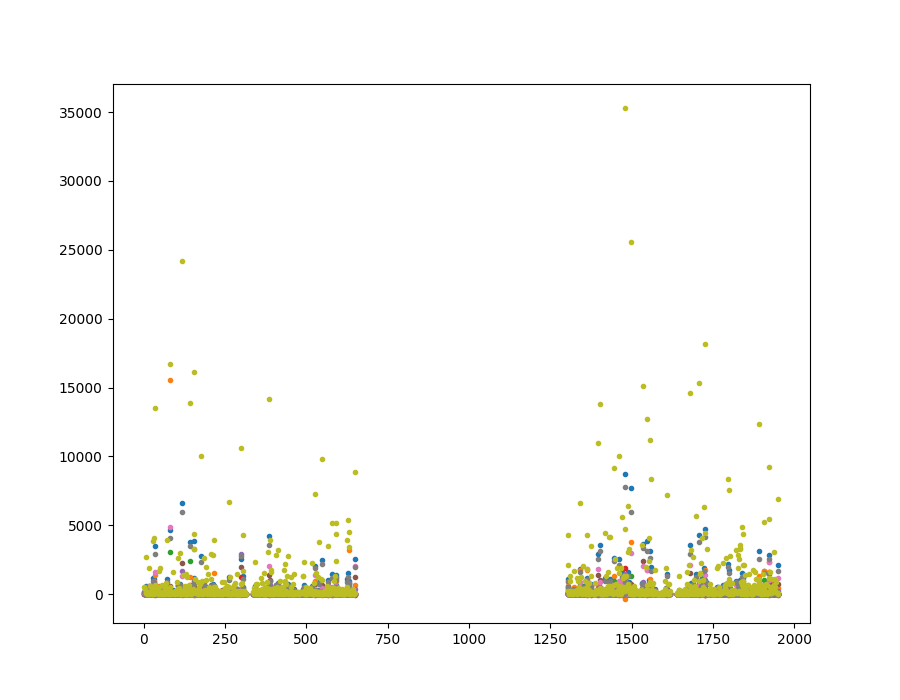

In [359]:
dset = ditherColl.ditherSets['sky_15_35_2']
dithers = adjustBackgrounds(dset)
_ = plotLevels(dithers)

## Adjust background for all datasets

In [361]:
for dset in ditherColl.ditherSets.values():
    dithers = adjustBackgrounds(dset)
    
# Note that both dset and dithers are now the last one on ditherColl

 0 91075      0.0      0.0     90.1     40.2  20916.9
 1 91076     -1.0      0.0     51.1     40.2   4793.9
 2 91077     -0.5     0.87     52.1     40.2   6755.4
 3 91078      0.5     0.87     54.3     40.2   3081.1
 4 91079      1.0      0.0     52.8     40.2   2599.7
 5 91080      0.5    -0.87     53.5     40.2   5083.2
 6 91081     -0.5    -0.87     54.6     40.2  11746.0
 0 91085      0.0      0.0 2.32e+02 2.15e+02     -8.6
 1 91086      0.0      0.0 2.32e+02 2.15e+02     -8.9
 0 91087      0.0      0.0 1.58e+02 1.43e+02     -8.5
 1 91088      0.0      0.0 1.58e+02 1.43e+02     -7.9
 0 91089      0.0      0.0 1.25e+02  1.1e+02     -6.3
 1 91090      0.0      0.0 1.26e+02  1.1e+02     -8.1
 0 91091      0.0      0.0 2.29e+02 2.12e+02     -9.5
 1 91092      0.0      0.0 2.29e+02 2.12e+02     -9.6
 0 91093      0.0      0.0 1.96e+02  1.8e+02     -9.0
 1 91094      0.0      0.0 1.96e+02  1.8e+02     -8.9
 0 91096      0.0      0.0     37.2     18.0  20011.9
 1 91097     -1.0      0.0  

234.99999999999997 35.0


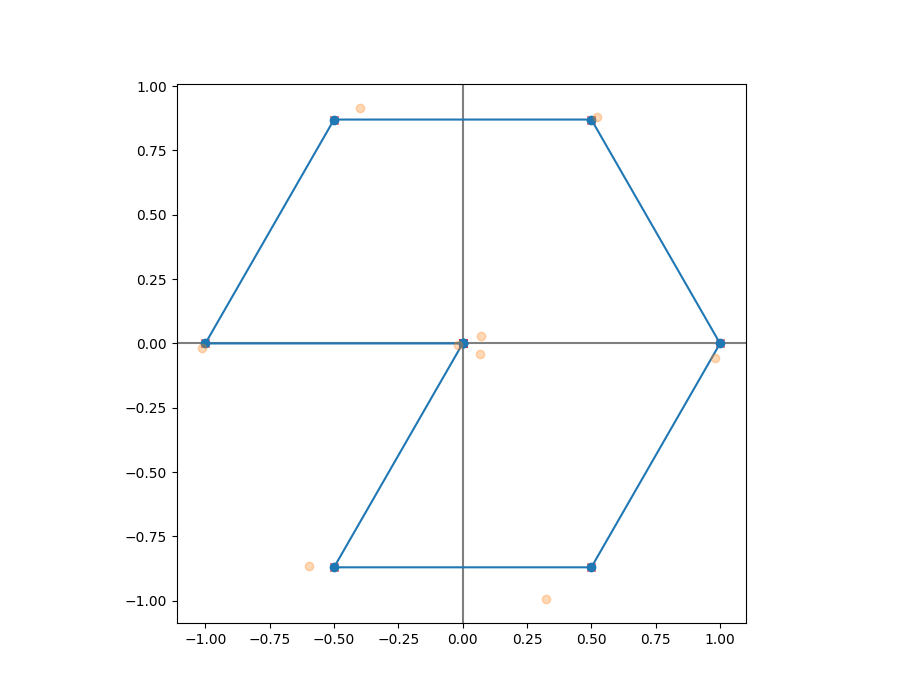

In [349]:
# Used only to debug an ra/dec disagreement. Keep for a little while.
dithers = dset.dithers

f, pl = plt.subplots()
dras = []
ddecs = []

dras_ng = []
ddecs_ng = []
for i, d in enumerate(dithers):
    if i == 0:
        ra0, dec0 = d.ra, d.dec
        print(ra0, dec0)
    dra = 3600*(d.ra - ra0)*np.cos(np.deg2rad(dec0))
    ddec = 3600*(d.dec - dec0)
    dras.append(dra)
    ddecs.append(ddec)
    
    dras_ng.append(d.dither_ra + d.dra)
    ddecs_ng.append(d.dither_dec + d.ddec)
    
    plt.plot([d.dither_ra], [d.dither_dec], 'x', color='red')
    
pl.plot(dras,ddecs, 'o-')
pl.plot(dras_ng,ddecs_ng, 'o', alpha=0.3)
plt.axhline(0, ls='-', color='black', alpha=0.5, zorder=-1)
plt.axvline(0, ls='-', color='black', alpha=0.5, zorder=-1)


pl.set_aspect('equal')

In [350]:
# List brightest fibers.
fluxes = np.zeros(shape=(len(dithers), dithers[0].fluxes.shape[0]), dtype='f4')
for i, d in enumerate(dithers):
    fluxes[i, :] = d.fluxes
maxFluxes = fluxes.max(axis=0)

a_i = maxFluxes.argsort()
maxFluxes = maxFluxes[a_i]

bright_i = np.where(~np.isnan(maxFluxes))
maxFluxes[bright_i][-100:]

#maxFluxes[-100:]

array([  5800.5264,   5867.3276,   6083.673 ,   6161.307 ,   6411.6606,
         6414.207 ,   6429.008 ,   6549.82  ,   6559.26  ,   6584.954 ,
         6722.3706,   6791.4985,   6859.2188,   6998.417 ,   7020.8345,
         7088.5615,   7281.9595,   7293.065 ,   7388.74  ,   7941.3164,
         8491.775 ,   8697.628 ,   8888.63  ,   8933.081 ,   8977.085 ,
         9545.686 ,   9891.852 ,   9940.076 ,   9963.205 ,   9986.889 ,
        10231.975 ,  10251.176 ,  10270.759 ,  10311.214 ,  10956.884 ,
        11043.588 ,  11149.497 ,  11166.725 ,  11504.398 ,  11653.86  ,
        11871.882 ,  11885.964 ,  12080.3   ,  12126.946 ,  12312.018 ,
        12477.108 ,  12489.243 ,  12550.279 ,  13014.568 ,  13069.113 ,
        13237.069 ,  13274.089 ,  13332.856 ,  13487.775 ,  13642.999 ,
        13657.733 ,  13697.429 ,  14279.205 ,  14494.942 ,  14524.855 ,
        14756.488 ,  15332.672 ,  17550.07  ,  17643.238 ,  17845.566 ,
        17912.975 ,  18071.686 ,  18729.234 ,  18741.234 ,  1883

## Main raster display

In [362]:
# Here, sadly, we need to select a global `dset` and `dithers`
# Easy enough to put the main plotter into a function, but I haven't
#
#dname = dset_names[-1]
# dname = 'm34_4'
dset = ditherColl.ditherSets['sky_15_35_2']
dithers = dset.dithers

In [79]:
reload(ditherSets)

def displayRaster(dset, usePFImm=True, rscale=1, magnification=None, fiberId=None, 
                  forceRebuild=False, fig='raster', noDisplay=False):
    """Display a dithered raster.
    
    Args
    ----
    dset : a DitherSet
       The collection of raster.py Dithers
    usePFImm : `bool`
       whether to plot in X-Y mm or RA/Dec
    """
    # Need to function-ize this and get away from global figures and plots.
    # The ditherSet object caches the postage stamps, as long as the basic configuration 
    # does not change (pixelScale, magnification, etc)

    reload(raster)

    dithers = dset.dithers
    d = dithers[0]
    pfsDesignId = d.pfsConfig.pfsDesignId

    R = 50                  # fibre radius, microns
    R *= rscale             # out of focus

    if usePFImm:
        side = 600          # side of stamps; microns
        side = 1000
        pixelScale = 7      # microns/pixel for stamps

        side *= rscale      # seems to work
        pixelScale *= rscale
    else:
        side = 10            # side of stamps; arcsec
        pixelScale = 0.1  # arcsec/pixel for stamps

    if magnification is None:
        magnification = 10 if len(dithers) <= 10 else 8

    # If we join separate dithers which had separate pfsConfigs, unify them a bit.
    for i, d in enumerate(dithers):
        if i == 0:
            boresight = raster.raDecStrToDeg(d.md["RA_CMD"], d.md["DEC_CMD"])

        d.pfsConfig.raBoresight, d.pfsConfig.decBoresight = boresight

    pfsConfig = dset.pfsConfig

    setUnimagedPixelsToNaN = True
    showNominalPosition = True
    showPhotometry = False
    correctExtinction = True
    useAsinh = True

    # Tell the dset what display parameters to use. If this changes from what was last used,
    # postage stamps will be regenerated.
    dset.updateImageCfg(side=side, pixelScale=pixelScale, R=R,
                        usePFImm=usePFImm, icrosstalk=icrosstalk,
                        correctExtinction=correctExtinction)

    # Actually build (or just return) the images and footprints.
    print("makeCobraImages...")
    images, extent_CI, visitImage = dset.getCobraImages(fiberId=fiberId, forceRebuild=forceRebuild)
    
    extinction = dset.extinction

    # Always use the same figure.
    figId = "raster"; plt.close(figId); fig = plt.figure(figId)

    if fiberId is not None:  # only show this one cobra
        ims = raster.plotSkyImageOneCobra(fiberId, pfsConfig, images, extent_CI, usePFImm, 
                                          vmin=0, vmax=10 if False else None)
        plt.colorbar(ims, label="SpS flux")
    else:
        print(f"makeSkyImage w/pixelScale={magnification*pixelScale}...")
        pfiIm, extent, stampOffset = raster.makeSkyImageFromCobras(pfsConfig, images, pixelScale=magnification*pixelScale, 
                                                                   usePFImm=usePFImm, setUnimagedPixelsToNaN=setUnimagedPixelsToNaN)
        if useAsinh:
            b = 10
            vmin, vmax = None, None
            norm = AsinhNorm(b, 0, 2e4)
        else:
            vmin, vmax=0, 2000 if True else None,
            norm = None

        print("displaySkyImage...")
        ims = raster.plotSkyImageFromCobras(pfsConfig, pfiIm, extent, stampOffset, usePFImm,
                                            showNominalPosition=showNominalPosition,
                                            vmin=vmin, vmax=vmax, norm=norm)
        plt.colorbar(ims, label="SpS flux", shrink=0.8 if showPhotometry else 1.0)
        xc, yc = (0, 0) if usePFImm else (pfsConfig.raBoresight, pfsConfig.decBoresight)
        plt.plot(xc, yc, '+', color='white')

        callback = raster.addCobraIdCallback(plt.gcf(), pfi, gfm, pfsConfig)

    title = f'{dithers[0].pfsConfig.designName} from {dset.visits[0]}\n{dset.comment}'
    if fiberId:
        title += f"fiberId {fiberId}"

    plt.title(title)

    if fiberId is None:
        if showPhotometry:
            raster.showDesignPhotometry(pfsConfig=None, butler=butler, dataId=dict(arm='r', visit=dithers[0].visit), 
                                        band=1, maglim=12, marker='o',
                                        showDesign=False, showGaia=True, cmap='rainbow' if False else 'gray')

        if usePFImm:
            plt.xlim(-210, 235)
            plt.ylim(-210, 235)
            
    return fig

In [371]:
def rebuildAllImages(ditherColl, names=None):
    if names is None:
        names = list(ditherColl.ditherSets.keys())
    for dn in names:
        print(f'{dn}...')
        ds = ditherColl.ditherSets[dn]
        try:
            _ = displayRaster(ds, noDisplay=True)
        except Exception as e:
            print(f'failed to construct images: {e}')

m44_1...
makeCobraImages...
makeSkyImage w/pixelScale=70...
displaySkyImage...
m44_2_v1_focus0...
makeCobraImages...
makeSkyImage w/pixelScale=70...
displaySkyImage...
m44_2_v1_focus-100...
makeCobraImages...
makeSkyImage w/pixelScale=70...
displaySkyImage...
m44_2_v1_focus+100...
makeCobraImages...
makeSkyImage w/pixelScale=70...
displaySkyImage...
m44_2_v1_focus+50...
makeCobraImages...
makeSkyImage w/pixelScale=70...
displaySkyImage...
m44_2_v1_focus-50...
makeCobraImages...
makeSkyImage w/pixelScale=70...
displaySkyImage...
sky_14_15_3_v0...
makeCobraImages...
makeSkyImage w/pixelScale=70...
failed to construct images: list index out of range
col256_1...
makeCobraImages...
makeSkyImage w/pixelScale=70...
displaySkyImage...
sky_15_35_1...
makeCobraImages...
makeSkyImage w/pixelScale=70...
failed to construct images: list index out of range
sky_15_35_2...
makeCobraImages...
makeSkyImage w/pixelScale=70...
displaySkyImage...
ngc6791_1...
makeCobraImages...
makeSkyImage w/pixelScale=70

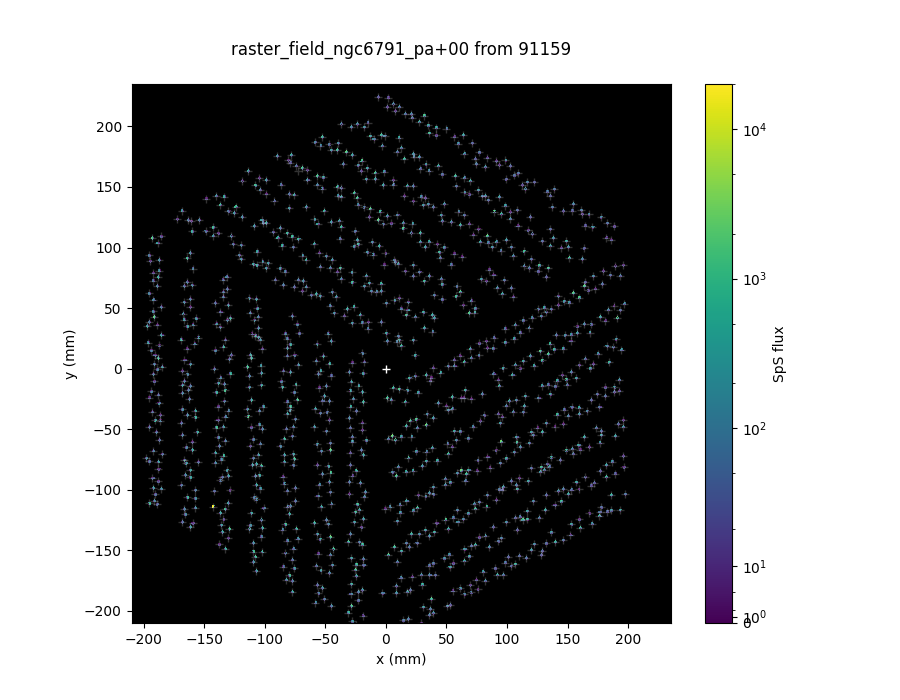

In [389]:
rebuildAllImages(ditherColl)

forcing image rebuild: {} != {'side': 1000, 'pixelScale': 7, 'R': 50, 'usePFImm': True, 'icrosstalk': None, 'correctExtinction': True}
makeCobraImages...
rebuilding images: True force=False 9 != 0


/work/stack_INFRA-312/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-3.0.0/lib/python3.8/site-packages/erfa/core.py:154: ErfaWarning: ERFA function "pmsafe" yielded 1 of "distance overridden (Note 6)"
  warnings.warn('ERFA function "{}" yielded {}'.format(func_name, wmsg),
/work/stack_INFRA-312/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-3.0.0/lib/python3.8/site-packages/erfa/core.py:4613: RuntimeWarning: invalid value encountered in ld
  p1 = ufunc.ld(bm, p, q, e, em, dlim)
/work/stack_INFRA-312/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-3.0.0/lib/python3.8/site-packages/erfa/core.py:19005: RuntimeWarning: invalid value encountered in anp
  c_retval = ufunc.anp(a)
/work/stack_INFRA-312/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-3.0.0/lib/python3.8/site-packages/erfa/core.py:4029: RuntimeWarning: invalid value encountered in atioq
  aob, zob, hob, dob, rob = ufunc.atioq(ri, di, astrom)


makeSkyImage w/pixelScale=70...
displaySkyImage...


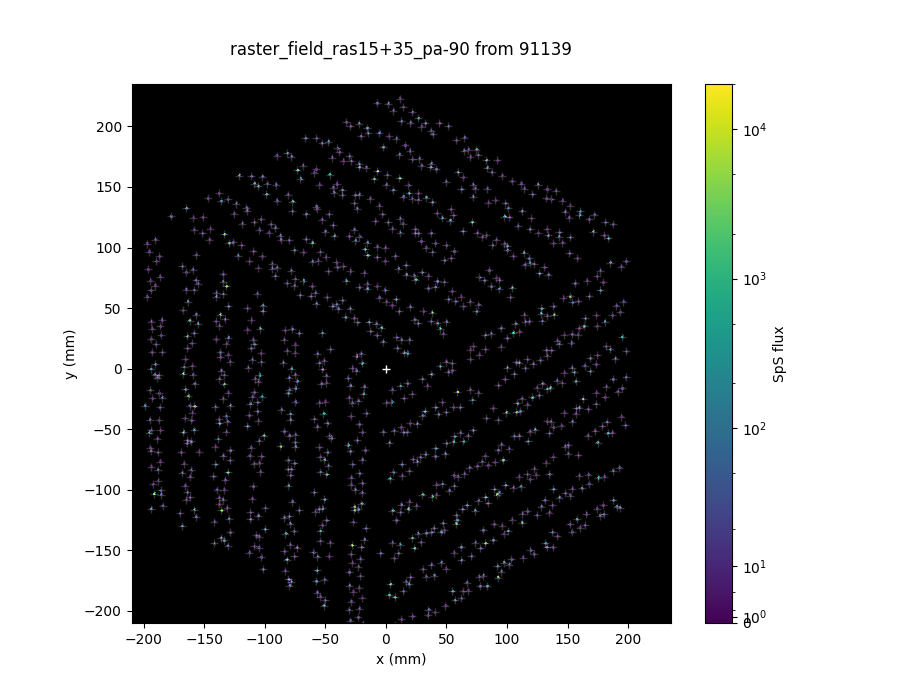

In [351]:
reload(raster)
#dset = ditherColl.ditherSets[dset_names[-1]]
_ = displayRaster(dset, usePFImm=True)

In [71]:
dithAll()

In [976]:
fig.savefig(dset.fullName(suffix='_0.57.mm.pdf'))

In [ ]:
extinction

In [69]:
# Just so we can generate 
def dithAll():
    f = plt.figure('raster')
    ima = f.axes[0]
    ima.set_xbound(-210, 235)
    ima.set_ybound(-210, 235)
    
def dithLim(x, y, rad=20):
    f = plt.figure('raster')
    ima = f.axes[0]
    ima.set_xbound(x-rad, x+rad)
    ima.set_ybound(y-rad, y+rad)
    
def dithBroad(x, y):
    dithLim(x, y, rad=40)
def dithFine(x, y):
    dithLim(x, y, rad=10)
    
def dithL1():
    dithBroad(-80,10)
def dithR1():
    dithBroad(35,-70)
def dithU1():
    dithBroad(30, 65)

def dithL2():
    dithBroad(-65,-30)


## Draw the vector offsets for each cobra

In [283]:
def plotCobraOffsets(dset, toTelescope=False,
                     fitOffsetRotation=True, showPFImm=True, maglim=8, 
                     errorsOnly=False, dither=None, figId='offsets'):
    """"""
    reload(raster)

    dithers = dset.dithers
    pfsConfig = dset.pfsConfig 
    images = dset.images
    extent_CI = dset.extent_CI
    visits = dset.visits
    usePFImm = dset.imageCfg['usePFImm']
    
    # N.b. asec are more accurate if you built the rasters with usePFImm == False

    xoff, yoff, weight = raster.calculateOffsets(images, extent_CI)
    mag = 20 - 2.5*np.log10(np.where(weight > 0, weight, np.NaN))

    x, y = pfsConfig.pfiNominal.T
    ignore = mag > maglim
    #ignore = np.logical_or(ignore, np.hypot(xoff, yoff) > 100)

    if not fitOffsetRotation:
        dxcen, dycen, a = 0.0, 0.0, 0.0
    else:
        fac = 1e3 if usePFImm else 1.0

        distortion = MeasureXYRot(np.where(ignore, np.NaN, x), y, xoff, yoff, nsigma=5)

        res = scipy.optimize.minimize(distortion, distortion.getArgs(), method='Powell')
        #print(f'res: {res}')
        #res.x *= 0

        dxcen, dycen, dscale, a, scale2 = res.x
        dxcen *= fac
        dycen *= fac

        #res[3] = 0.0  # Don't use fitted rotation

        distortion.setArgs(res.x)
        tx, ty = distortion.distort(x, y)

        if False:
            print(f"{np.nanstd(xoff):.3f} -> {np.nanstd(fac*(x + xoff/fac - tx)):.3f}")
            print(f"{np.nanstd(yoff):.3f} -> {np.nanstd(fac*(y + yoff/fac - ty)):.3f}")

        dtx, dty = fac*(tx - x), fac*(ty - y)

        showModel = False
        if showModel:
            xoff = dtx
            yoff = dty
        else:
            xoff -= dtx
            yoff -= dty
    
    print(f"{np.nanmedian(np.hypot(xoff, yoff)):.3f}")
    plt.close(figId); 
    fig, pl = plt.subplots(num=figId)

    if False:
        raster.offsetsAsQuiver(pfsConfig, xoff, yoff, usePFImm=usePFImm, quiverLen=100, scale=2e3, select=ignore)
        raster.offsetsAsQuiver(pfsConfig, xoff, yoff, usePFImm=usePFImm, quiverLen=100, scale=2e3, select=ignore==False,
                               quiver_args=dict(color='red'))
    else:
        quiver_args = dict(alpha=np.where(np.hypot(xoff, yoff) < 150, 1, 0.2))
        offsetScale = 1
        if showPFImm:
            if not usePFImm:
                offsetScale = 1e2   # convert asec to microns 
            quiverLen=100
            scale=1e3
        else:
            if usePFImm:
                offsetScale = 1e-2    # convert microns to asec
            quiverLen=1.0
            scale=10

        Q = raster.offsetsAsQuiver(pfsConfig, offsetScale*xoff, offsetScale*yoff, C=mag, usePFImm=showPFImm,
                                   quiverLen=quiverLen, scale=scale, select=ignore == False, quiver_args=quiver_args)

        plt.colorbar(Q, label='"magnitude" based on weight')

    if showPFImm:
        plt.plot([0], [0], '+', color='red')
        plt.ylim(plt.xlim(-210, 235))
    else:
        plt.plot([pfsConfig.raBoresight], [pfsConfig.decBoresight], '+', color='red')
        
    title = f"{dithers[0].visit}..{dithers[-1].visit} {dithers[0].pfsConfig.designName}"
    title += f"  mag < {maglim}";
    if fitOffsetRotation:
        title += f"\n  (dx, dy) = ({dxcen:.0f}, {dycen:.0f})mu dtheta = {a:.3}deg scales={dscale:.3},{scale2:.3}"
    plt.title(title);
    
    fig.tight_layout()
    
    return fig, xoff, yoff, res.x if fitOffsetRotation else None

In [385]:
dset = ditherColl.ditherSets['ngc6791_1']

23.925


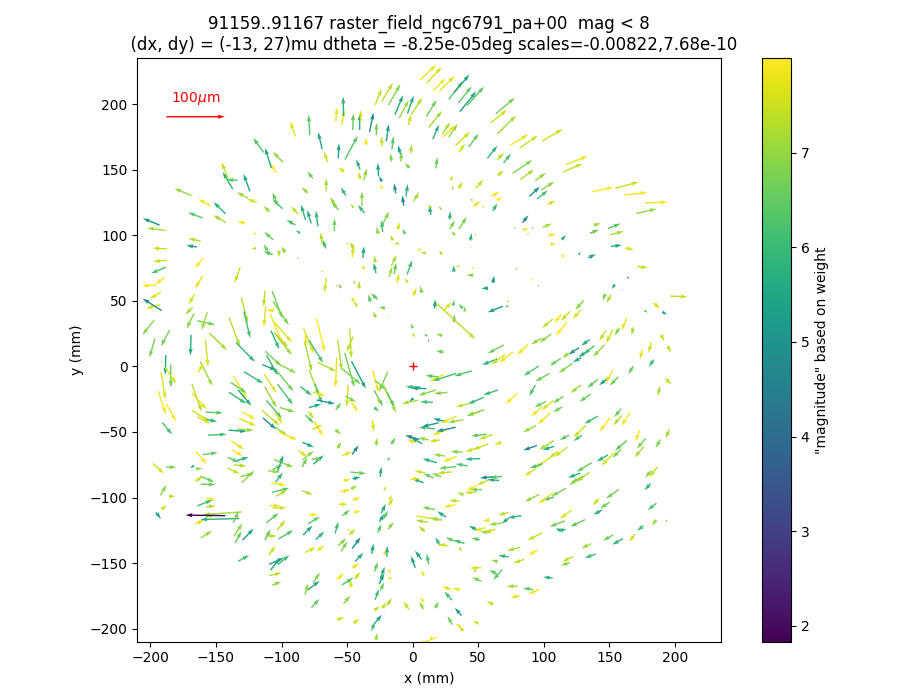

In [386]:
fig, xoff, yoff, coeffs = plotCobraOffsets(dset, maglim=8, figId=f'offsets_{dset.name}')

In [353]:
ditherColl.ditherSets

{'m44_1': <ditherSets.DitherSet at 0x7fc5b009a040>,
 'm44_2_v1_focus0': <ditherSets.DitherSet at 0x7fc5a6a43430>,
 'm44_2_v1_focus-100': <ditherSets.DitherSet at 0x7fc5a6a43e80>,
 'm44_2_v1_focus+100': <ditherSets.DitherSet at 0x7fc5a6a43df0>,
 'm44_2_v1_focus+50': <ditherSets.DitherSet at 0x7fc565bd5dc0>,
 'm44_2_v1_focus-50': <ditherSets.DitherSet at 0x7fc565bd54c0>,
 'sky_14_15_3_v0': <ditherSets.DitherSet at 0x7fc57904af70>,
 'col256_1': <ditherSets.DitherSet at 0x7fc577a9c3a0>,
 'sky_15_35_1': <ditherSets.DitherSet at 0x7fc578eae5b0>,
 'sky_15_35_2': <ditherSets.DitherSet at 0x7fc577e00040>,
 'ngc6791_1': <ditherSets.DitherSet at 0x7fc578eaeac0>}

In [390]:
dset_names = ['col256_1', 'sky_15_35_2', 'ngc6791_1']

In [391]:
ds.images

[]

col256_1:  ....
31.133
sky_15_35_2: repeat due to sky conditions ....
20.069
ngc6791_1:  ....
23.925


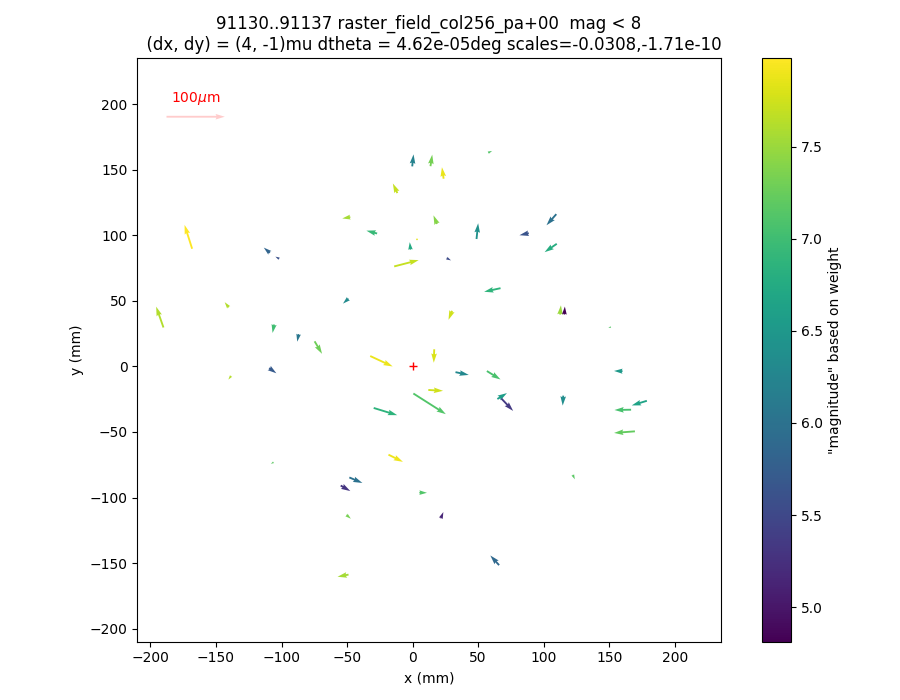

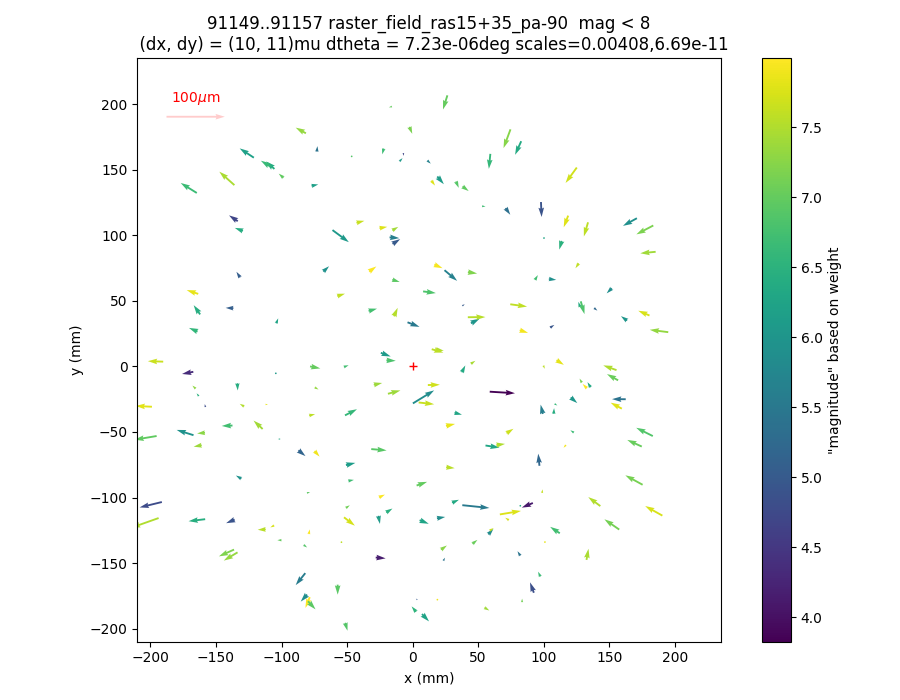

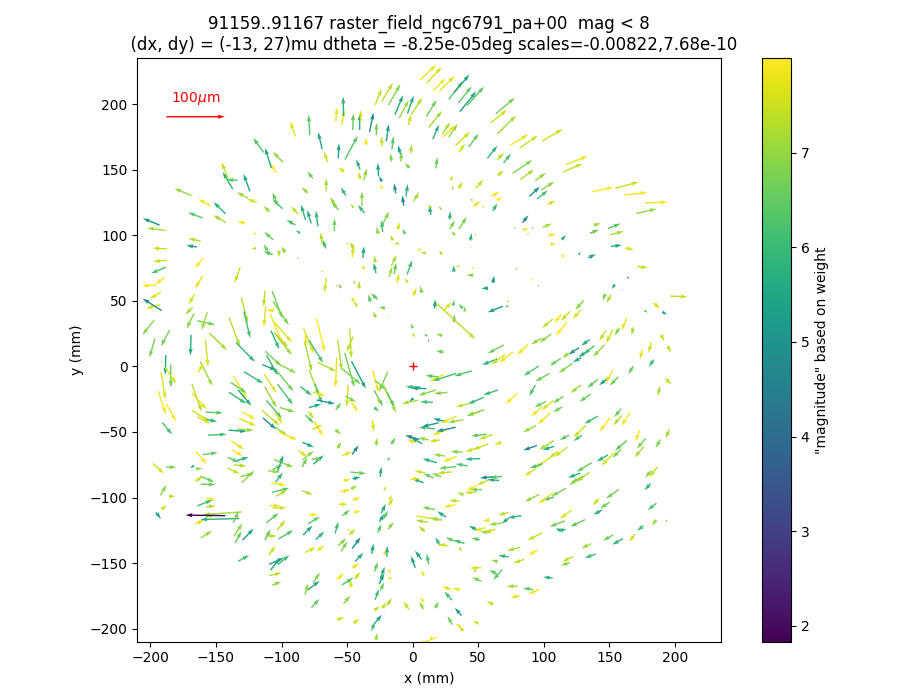

In [392]:
reload(raster)

dc = {}
for dn in dset_names:
    ds = ditherColl.ditherSets[dn]
    print(f'{dn}: {ds.comment} ....')
    fig, xoff, yoff, coeffs = plotCobraOffsets(ds, maglim=8, figId=f'offsets_{dn}')
    dc[dn] = (fig, xoff, yoff, coeffs)

m34_1: 1.0arcsec hex grid; focus=+0.57mm ....
m34_2: 1.0arcsec hex grid; focus=+0.57mm ....
ngc1980_23: 1.0arcsec hex grid; focus=+0.57mm ....
m34_3: 1.0arcsec hex grid; focus=+0.57mm ....
ngc1980_24: 1.0arcsec hex grid; focus=+0.57mm; after MCS corr ....
m34_4: 1.0arcsec hex grid; focus=+0.57mm ....
m34_5: 1.0arcsec hex grid; focus=+0.57mm ....
m39_13: 1.0arcsec hex grid; focus=+0.57mm ....
ngc1980_25: 1.0arcsec hex grid; focus=+0.57mm ....
ngc1980_26: 1.0arcsec hex grid; focus=+0.57mm; w/FA ....
m39_14: 1.0arcsec hex grid; focus=+0.57mm ....
m39_15: 1.0arcsec hex grid; focus=+0.57mm; dist applied ....


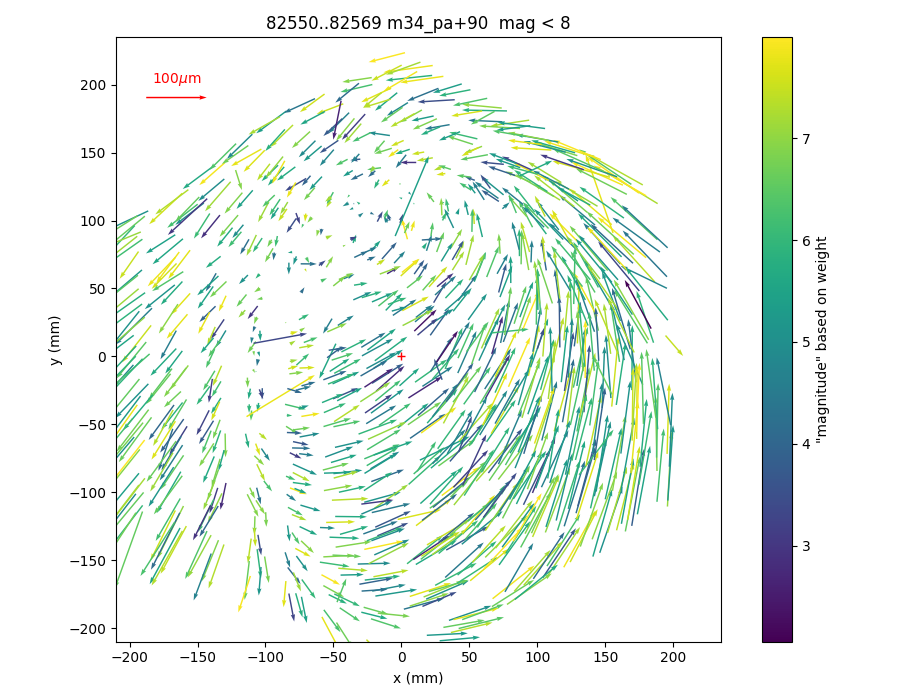

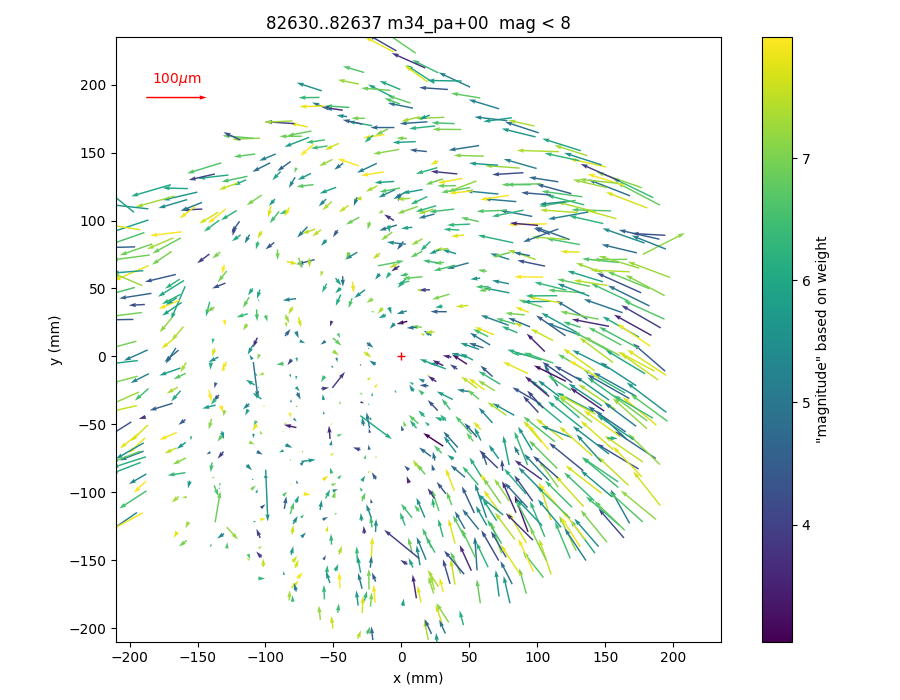

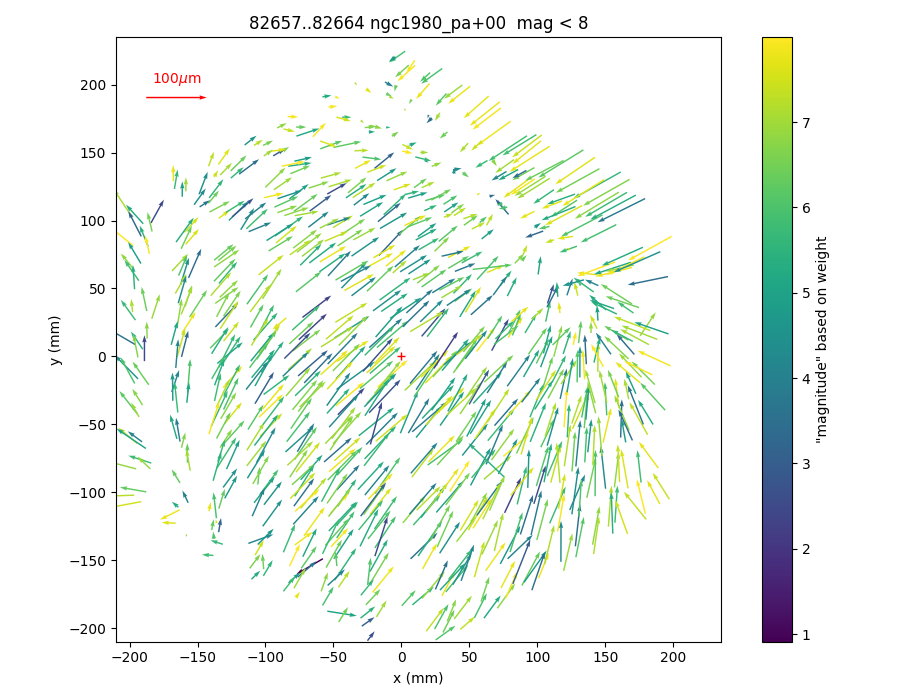

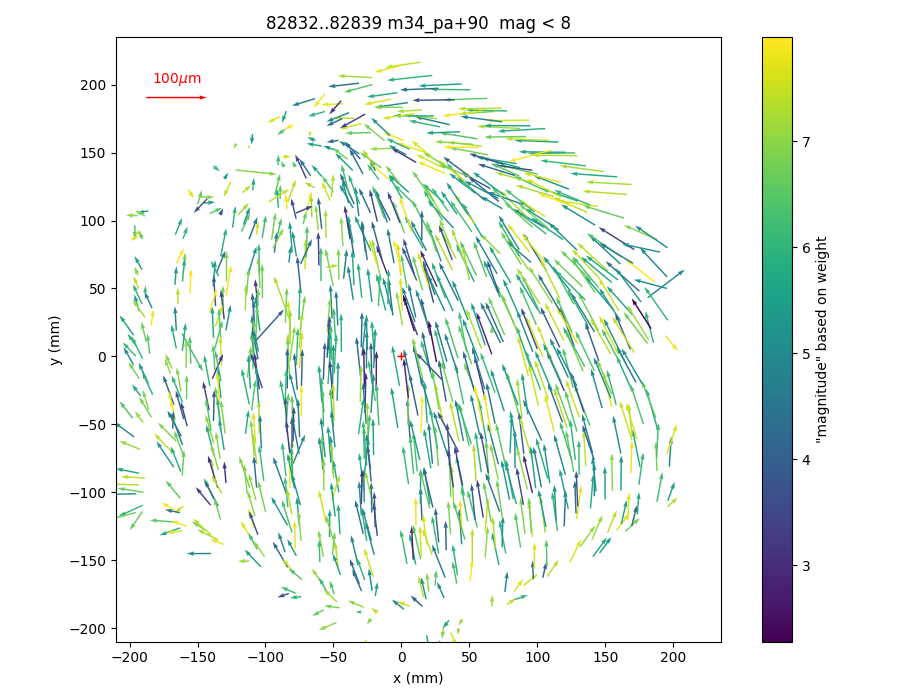

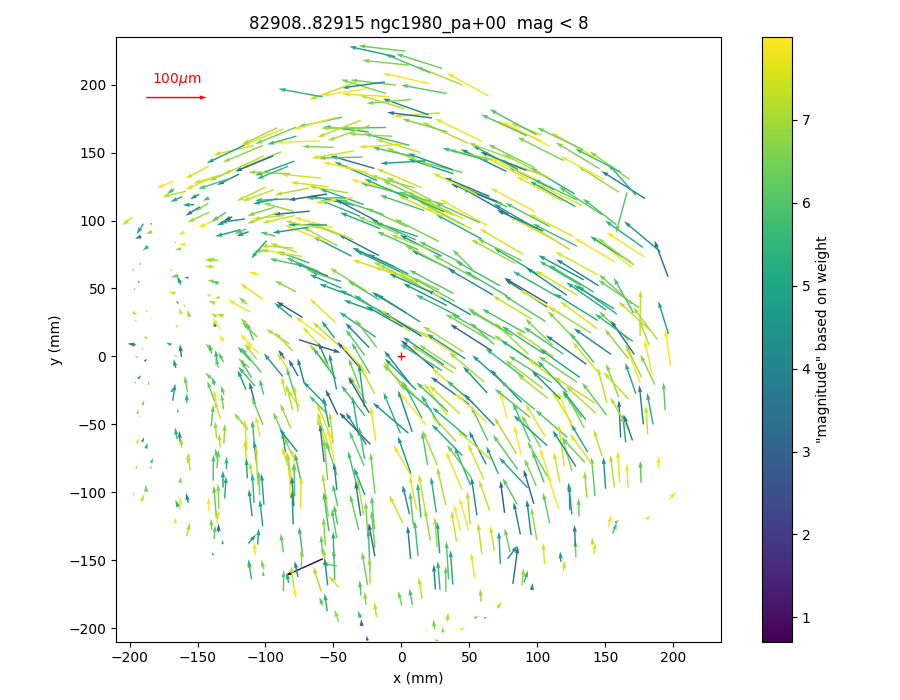

...

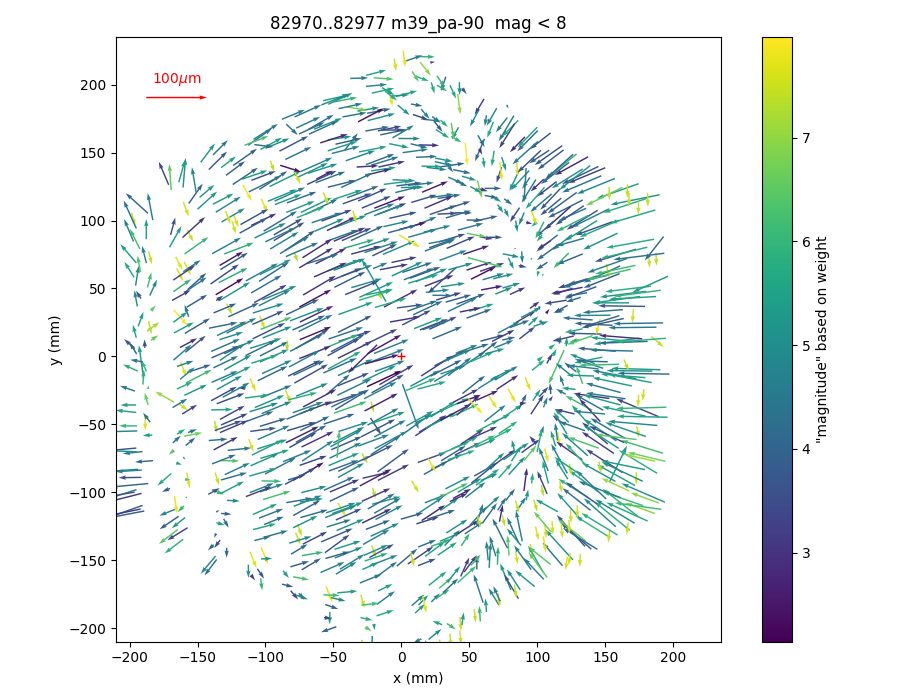

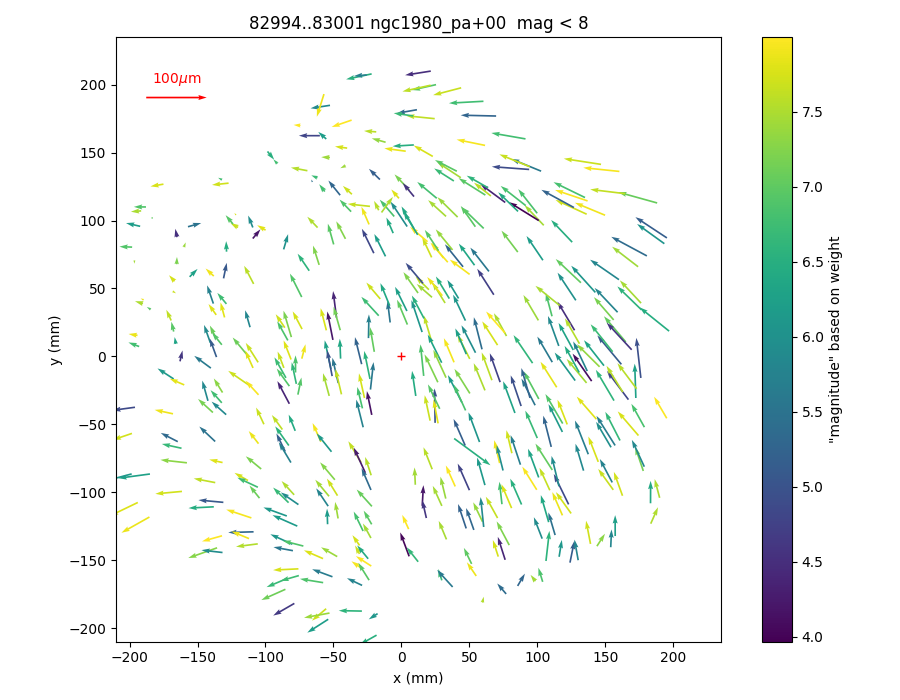

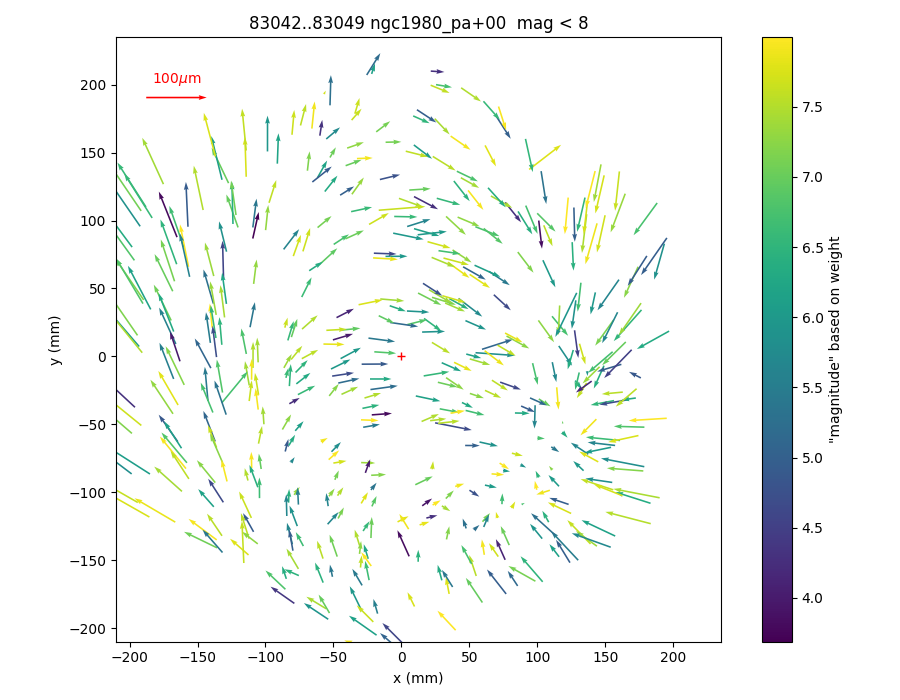

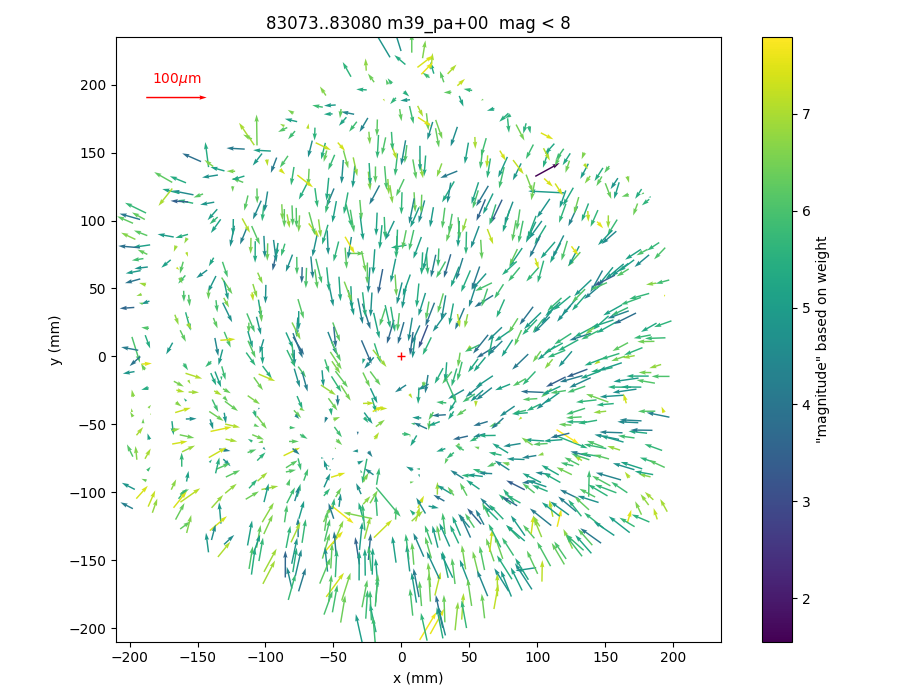

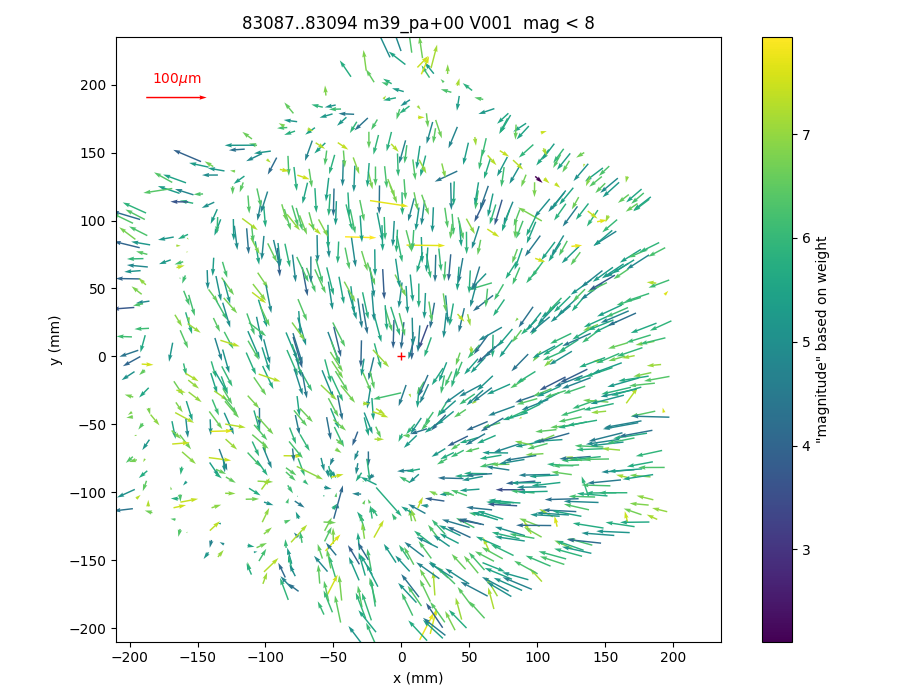

In [1071]:
reload(raster)

dnc = {}
for dn in dset_names:
    ds = ditherColl.ditherSets[dn]
    print(f'{dn}: {ds.comment} ....')
    fig, xoff, yoff, coeffs = plotCobraOffsets(ds, maglim=8, figId=f'offsets_{dn}', fitOffsetRotation=False)
    dnc[dn] = (fig, xoff, yoff, coeffs)

In [1033]:
rows = []
for dn, dres in dc.items():
    coeffs = dres[-1]
    rows.append([dn, *coeffs])
    print(f'{dn:15s} {coeffs[0]:+0.3f},{coeffs[1]:+0.3f} {coeffs[2]:+0.6f} {coeffs[3]:+0.6f}')

m34_1           +0.008,+0.023 -0.02 -0.000113
m34_2           -0.024,+0.009 -0.00654 -0.000141
ngc1980_23      +0.019,+0.036 -0.00168 -8.01e-05
m34_3           -0.018,+0.043 -0.00435 -0.000114
ngc1980_24      -0.037,+0.033 -0.01 -0.000131
m34_4           +0.002,+0.032 -0.00163 -4.24e-05
m34_5           -0.012,+0.039 -0.0141 -1.44e-05
m39_13          +0.013,+0.008 +0.00185 -0.000133
ngc1980_25      -0.021,+0.026 -0.00379 -6.95e-05
ngc1980_26      +0.007,+0.005 +0.0101 -4.52e-05
m39_14          -0.007,-0.005 +3.97e-06 -0.00029
m39_15          -0.011,-0.012 +0.000841 -0.000229


0          m34_1
1          m34_2
2     ngc1980_23
3          m34_3
4     ngc1980_24
5          m34_4
6          m34_5
7         m39_13
8     ngc1980_25
9     ngc1980_26
10        m39_14
11        m39_15
Name: name, dtype: object


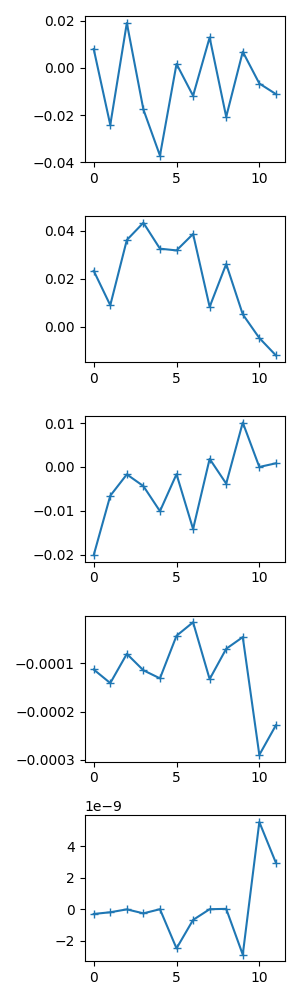

In [1053]:
print(res['name'])
f, pl = plt.subplots(nrows=5, figsize=(3, 10))

pl[0].plot(res['xs'], '+-')
pl[1].plot(res['ys'], '+-')
pl[2].plot(res['rot'], '+-')
pl[3].plot(res['scale'], '+-')
pl[4].plot(res['dscale'], '+-')
f.tight_layout()

In [1045]:
res = pd.DataFrame(rows)
res.columns = ['name', 'xs', 'ys', 'rot', 'scale', 'dscale']

27.703


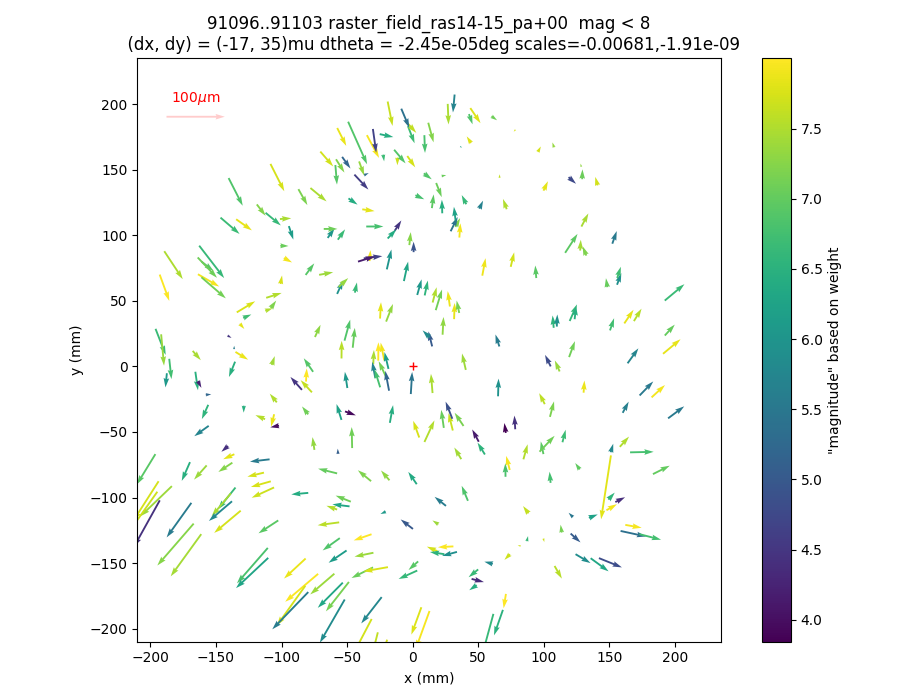

In [277]:
reload(raster)
fig, xoff, yoff, coeffs = plotCobraOffsets(dset, maglim=8)

In [1126]:
fig.savefig(dset.fullName(suffix='corr_q.pdf'))

46.406


UnboundLocalError: local variable 'res' referenced before assignment

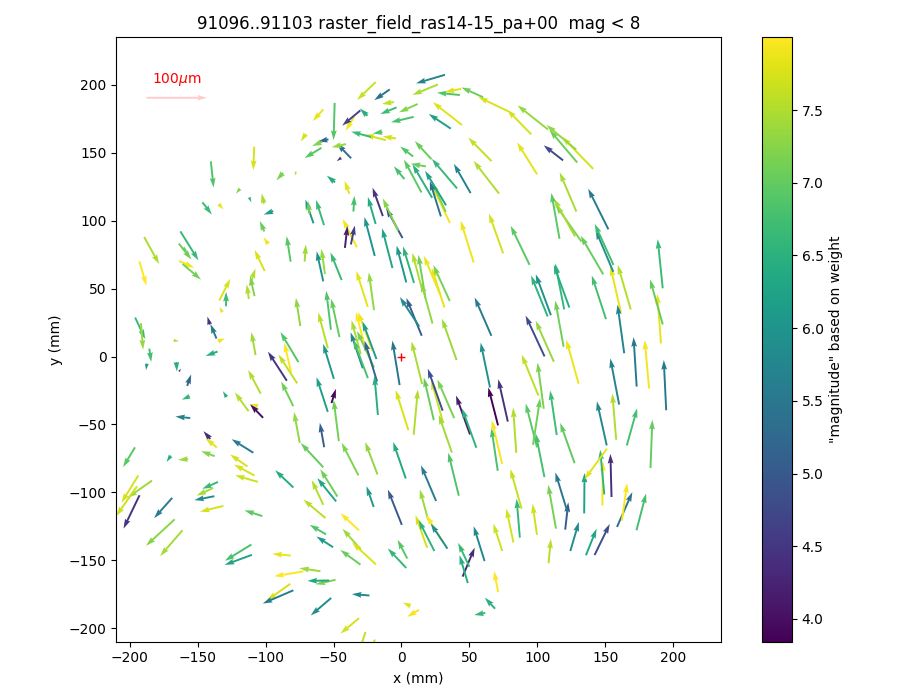

In [282]:
reload(raster)
fig, xoff, yoff, coeffs = plotCobraOffsets(dset, maglim=8, fitOffsetRotation=False)


In [1128]:
fig.savefig(dset.fullName(suffix='nocorr_q.pdf'))

### Save offsets to .csv

In [1130]:
import pandas as pd
x, y = dithers[0].pfsConfig.pfiNominal.T
off_df = pd.DataFrame(dict(x=x, y=y,
                           xoff=xoff/1000,
                           yoff=yoff/1000,
                           weight=weight,
                           fiberId=dithers[0].pfsConfig.fiberId))
off_df.to_csv(dset.fullName(suffix='offset.csv'))
off_df

,x,y,xoff,yoff,weight,fiberId
0,-50.457741,24.969215,0.010979,-0.029434,8.269892e+05,2
1,NaN,NaN,NaN,NaN,0.000000e+00,3
2,-49.719101,21.811672,0.021853,-0.033112,1.082696e+06,4
3,-54.001297,18.002882,0.013855,-0.042165,1.468128e+05,5
4,-51.505646,10.987838,0.012892,-0.034367,2.825147e+05,6
...,...,...,...,...,...,...
1192,83.419243,-36.590080,0.014544,-0.010570,2.009351e+05,1948
1193,93.074799,-41.458652,0.007881,-0.004266,9.834141e+04,1949
1194,88.502457,-34.841228,-0.014130,0.003133,5.999735e+05,1950
1195,97.063461,-35.632210,0.007282,-0.016984,4.307563e+05,1951


## Load essentials from .csv

In [ ]:
offsets = dict()
configs = dict()
for dn, ds in ditherColl.ditherSets.items():
    try:
        offsets[dn] = pd.read_csv(ds.fullName(suffix='offset.csv'))
        configs[dn] = ds.dithers[0].pfsConfig
        print(f'yup on {dn}')
    except Exception as e:
        print(f'nope on {dn}: {e}')

## Utilities

### Show visit order in dither

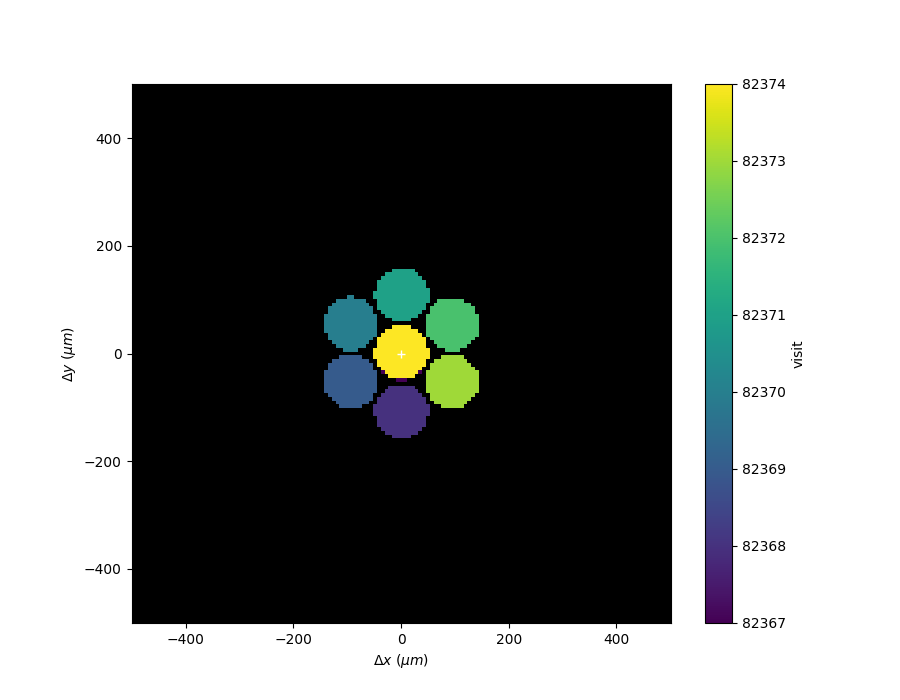

In [ ]:
plt.close('visitOrder'); f, pl = plt.subplots(num='visitOrder')
ims2 = raster.plotVisitImage(visitImage, extent_CI, usePFImm)
plt.colorbar(ims2, label="visit");

### Draw patrols

In [ ]:
def drawPatrols(pfi, gfm):
    #
    # Draw the nominal patrol regions
    #
    if pfi is not None:
        plt.figure("raster")
        ax = plt.gca()

        r = np.mean(pfi.L1 + pfi.L2)
        for cobraId, xy in enumerate(pfi.centers, 1):
            specId = gfm.spectrographId[gfm.cobraId == cobraId][0]
            if specId in [1]:
                c = Circle((xy.real, xy.imag), r, color='white', alpha=0.1)
                ax.add_patch(c)

In [ ]:
drawPatrols(pfi, gfm)

## Show images

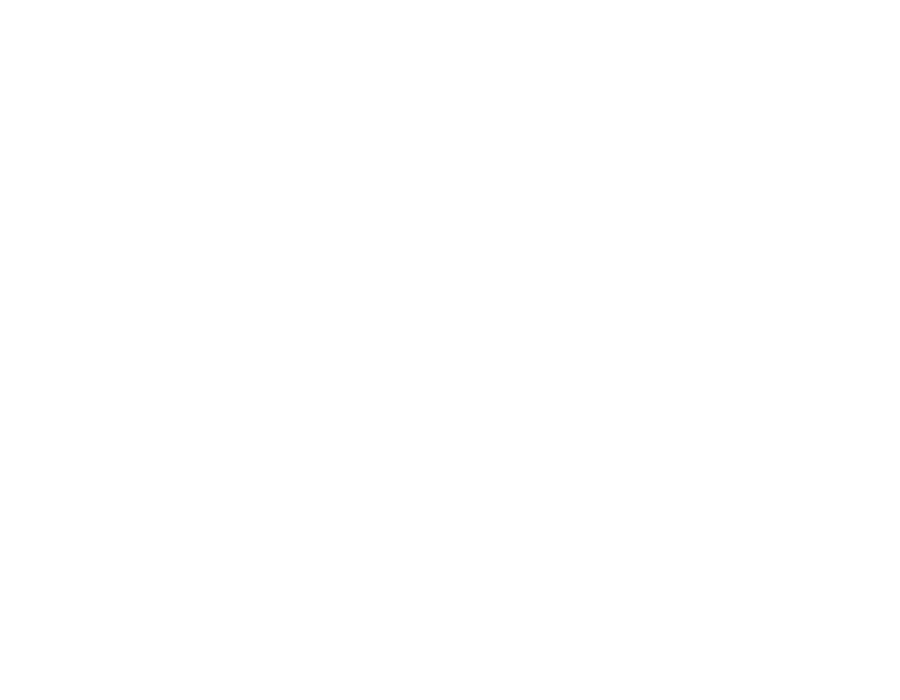

In [165]:
b = drpButler

dataId.update(visit=dset.visits[0], spectrograph=3)
exp = b.get('calexp', dataId)

pfsConfig = b.get("pfsConfig", dataId)
pfsConfig = pfsConfig[pfsConfig.spectrograph == dataId["spectrograph"]]
detMap = b.get("detectorMap", dataId)

fig = 1; plt.close(fig); fig = plt.figure(fig)
disp = afwDisplay.Display(fig)
disp.scale('asinh', 'zscale', Q=8)
#disp.scale('asinh', min=0, max=10, Q=8)
disp.setDefaultMaskPlaneColor("REFLINE", afwDisplay.IGNORE)

disp.mtv(exp, title=f"{'%(visit)d %(arm)s%(spectrograph)d' % dataId}")
#addPfsCursor(disp, detMap);

#from pfs.drp.stella.utils import showDetectorMap

#showDetectorMap(disp, pfsConfig, detMap)


disp.zoom(64, 1007, 870)

In [181]:
dset.visits

[91096, 91097, 91098, 91099, 91100, 91101, 91102, 91103, 91104]

In [182]:
dataId.update(visit=dset.visits[0])
pfsConfig = b.get('pfsConfig', dataId)
pfsConfig = pfsConfig[pfsConfig.spectrograph == dataId["spectrograph"]]
spec = b.get('pfsArm' if True else 'pfsMerged', dataId)


In [170]:
def getFig(figId=None):
    if figId is not None:
        plt.close(figId)
    fig = plt.figure(figId)
    return fig

In [183]:
spec.flux.shape

(616, 4176)

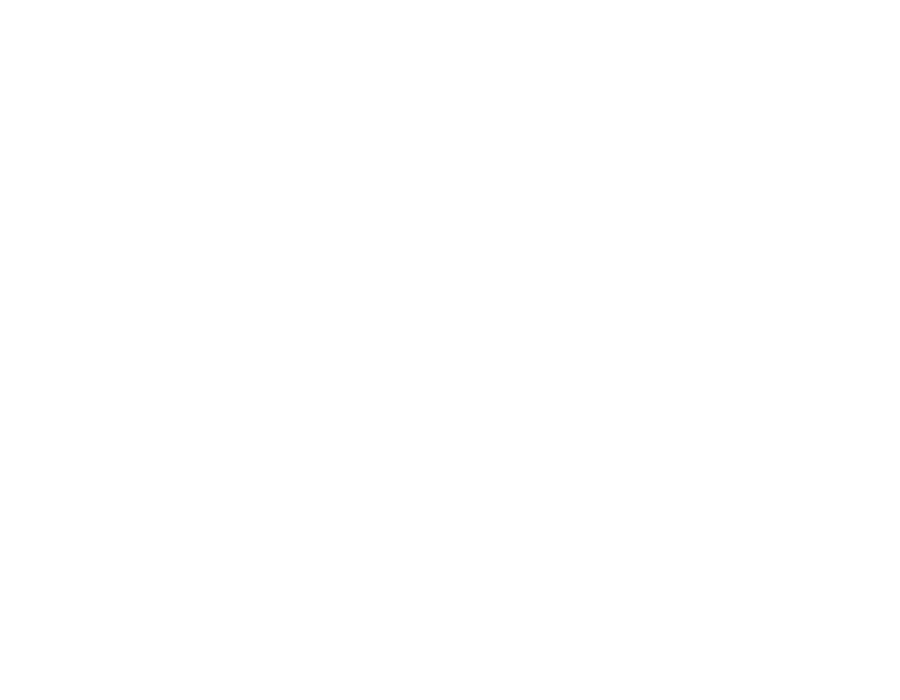

In [171]:
fig = getFig('spec')

plt.plot(spec.wavelength[l][0], spec.flux[l][0], label=f"{visit}");


KeyboardInterrupt: 

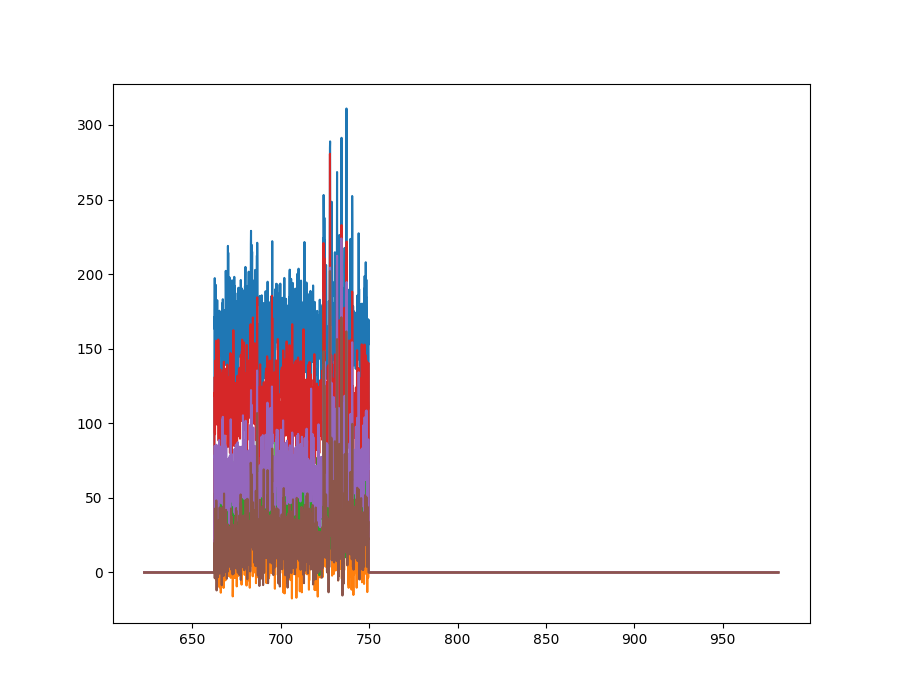

In [166]:
fig = getFig('spec')

b = drpButler

fid = 1805 if False else 1867
fid = 200

for visit in dset.visits:
    dataId.update(visit=visit, spectrograph=1)

    pfsConfig = b.get('pfsConfig', dataId)
    pfsConfig = pfsConfig[pfsConfig.spectrograph == dataId["spectrograph"]]
    spec = b.get('pfsArm' if True else 'pfsMerged', dataId)

    l = pfsConfig.fiberId == fid
    plt.plot(spec.wavelength[l][0], spec.flux[l][0], label=f"{visit}");
    
print(pfsConfig.pfiNominal[l][0])
    
plt.legend(ncol=2)
plt.title(f"fiberId: {fid}");

# Messing around

In [116]:
import scipy.optimize

import cpl
reload(cpl)

<module 'cpl' from '/work/cloomis/notebooks/cpl.py'>

In [120]:
_sp, _cfg = cpl.getTrimmedSpectra(drpButler, dataId)

In [ ]:
scipy.optimize.minimize(

In [125]:
cfg =  drpButler.get('pfsConfig', dataId)

In [126]:
fi = np.where(cfg.fiberId == 202)[0][0]
cfg.ra[fi], cfg.dec[fi]

(130.55875366275188, 19.454060400449787)

In [127]:
arm = drpButler.get('pfsArm', dataId=dataId)

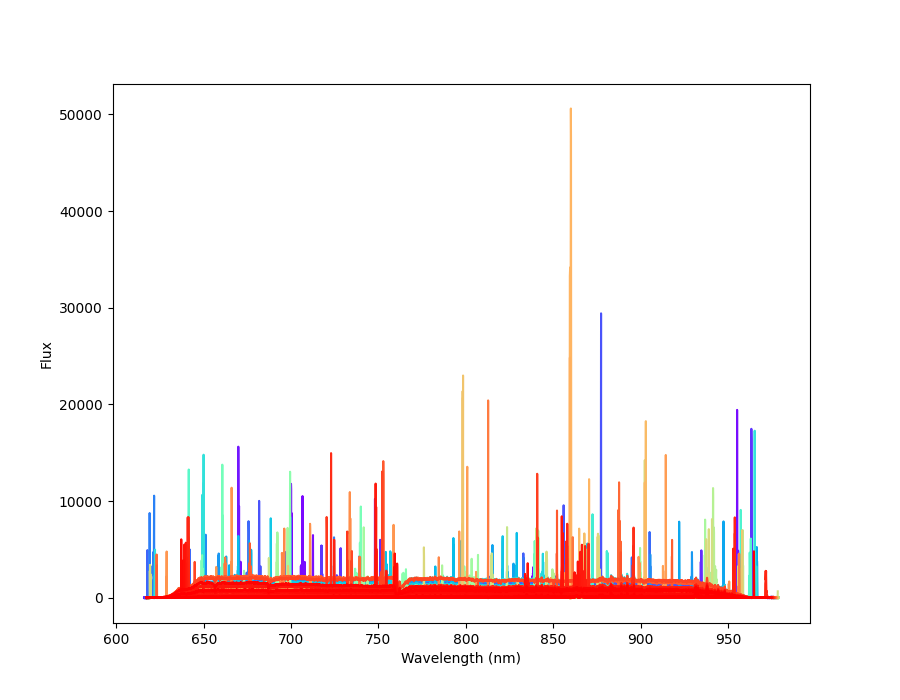

(<Figure size 900x700 with 1 Axes>,
 <AxesSubplot:xlabel='Wavelength (nm)', ylabel='Flux'>)

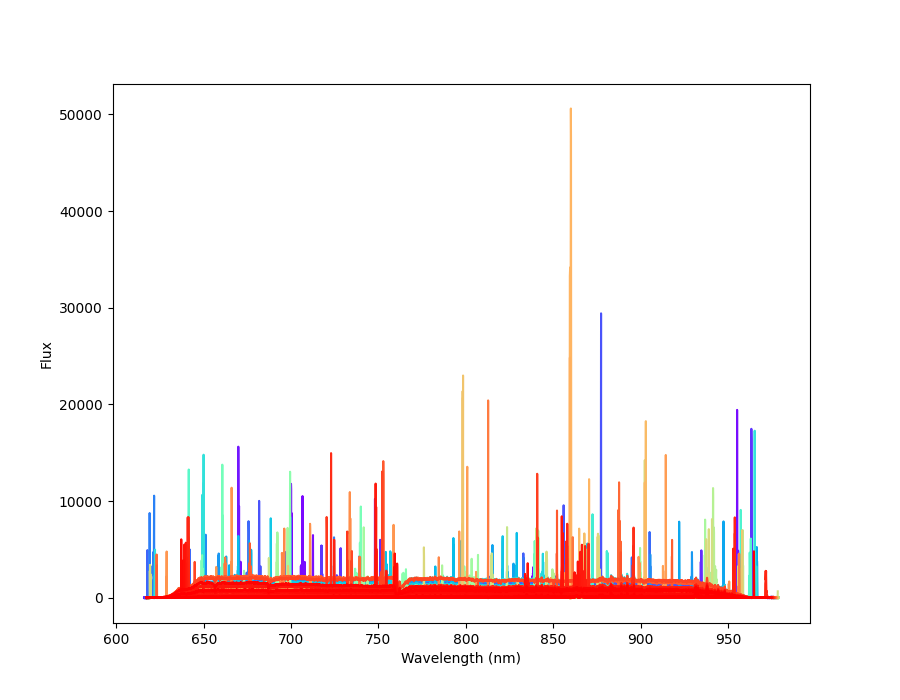

In [128]:
arm.plot()

In [115]:
from pfs.utils.coordinates.CoordTransp import CoordinateTransform

In [ ]:
fra = []
fdec = []
bra = []
bdec = []
xx = []
yy = []
fid = 400
utc0 = None
for i, d in enumerate(dithers):
    cfg = d.pfsConfig
    md = d.md
    altitude = md['ALTITUDE']
    pa = md['INST-PA']
    adc = md['ADC-STR']
    boresight = [[d.ra], [d.dec]]
    # boresight = [cfg.ra[fid] + i*0.0001], [cfg.dec[fid] + i*0.0001]

    utc = f"{md['DATE-OBS']} {md['UT']}"
    if utc0 is None:
        utc0 = utc
    x, y = CoordinateTransform(np.stack(([cfg.ra[fid]], [cfg.dec[fid]])),
                                           mode="sky_pfi", za=90.0 - altitude,
                                           pa=pa, cent=boresight, time=utc, 
                                           adc=adc)[0:2]
    x, y = y, -x
    
    #x, y = CoordinateTransform(np.stack(([d.ra], [d.dec])),
    #                                       mode="sky_pfi", za = 90, #za=90.0 - altitude,
    #                                       pa=pa, cent=[[cfg.ra[fid]], [cfg.dec[fid]]], time=utc)[0:2]

    fra.append(cfg.ra[fid])
    fdec.append(cfg.dec[fid])
    bra.append(d.ra)
    bdec.append(d.dec)
    xx.append(x[0])
    yy.append(y[0])
        
    # print(cfg.ra[fid], cfg.dec[fid], round(d.ra,5), round(d.dec,5), round(x[0], 5), round(y[0], 5), pa, altitude, utc)

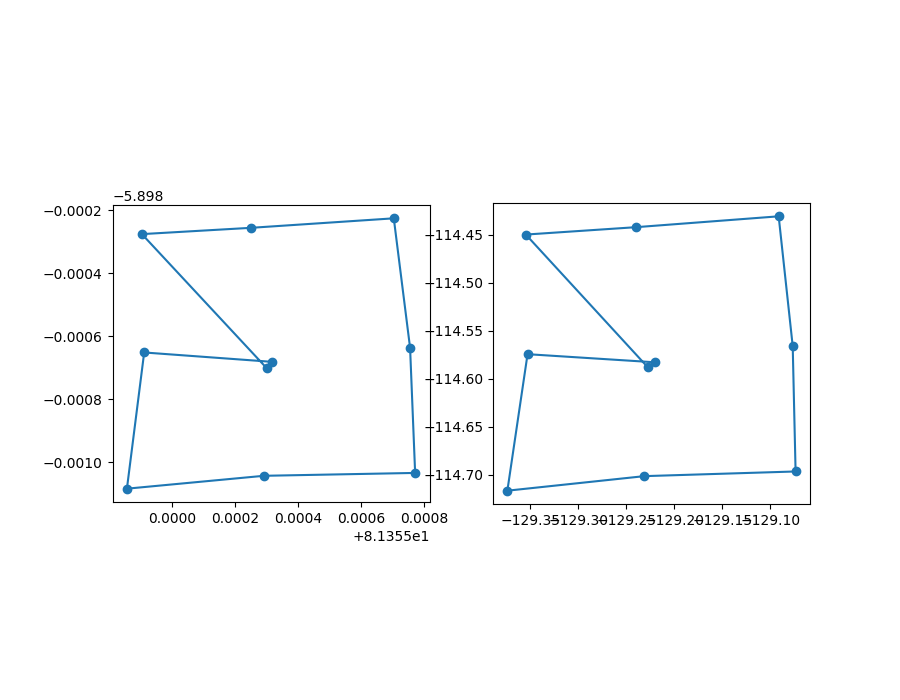

In [ ]:
f,pl = plt.subplots(ncols=2)
p1,p2 = pl
p1.set_aspect('equal')
p2.set_aspect('equal')
p1.plot(bra,bdec, 'o-')
#p2.plot(fra,fdec, 'o')
p2.plot(xx,yy, 'o-')


In [ ]:
fra = []
fdec = []
bra = []
bdec = []
xx = []
yy = []
fid = 400
utc0 = None
d = dithers[0]
d2 = dithers[-1]

cfg = d.pfsConfig
md = d.md
md2 = d2.md

altitude = md['ALTITUDE']
altitude2 = md2['ALTITUDE']
pa = md['INST-PA']
adc = md['ADC-STR']
adc2 = md2['ADC-STR']

good_i = ~np.isnan(cfg.dec)
good_w = np.where(good_i)

ras = cfg.ra[good_w]
decs = cfg.dec[good_w]

boresight = [[d.ra], [d.dec]]
utc = f"{md['DATE-OBS']} {md['UT']}"
utc2 = f"{md2['DATE-OBS']} {md2['UT']}"
if utc0 is None:
    utc0 = utc
    
xx1, yy1 = CoordinateTransform(np.stack((ras, decs)),
                           mode="sky_pfi", za=90.0 - altitude,
                           pa=pa, cent=boresight, time=utc, 
                           adc=adc)[0:2]
xx2, yy2 = CoordinateTransform(np.stack((ras, decs)),
                           mode="sky_pfi", za=90.0 - altitude,
                           pa=pa, cent=boresight, time=utc2, 
                           adc=adc)[0:2]
# x, y = y, -x
    
    #x, y = CoordinateTransform(np.stack(([d.ra], [d.dec])),
    #                                       mode="sky_pfi", za = 90, #za=90.0 - altitude,
    #                                       pa=pa, cent=[[cfg.ra[fid]], [cfg.dec[fid]]], time=utc)[0:2]

#    fra.append(cfg.ra[fid])
#    fdec.append(cfg.dec[fid])
#    bra.append(d.ra)
#    bdec.append(d.dec)
#    xx.append(x[0])
#    yy.append(y[0])


0.002502432969791673


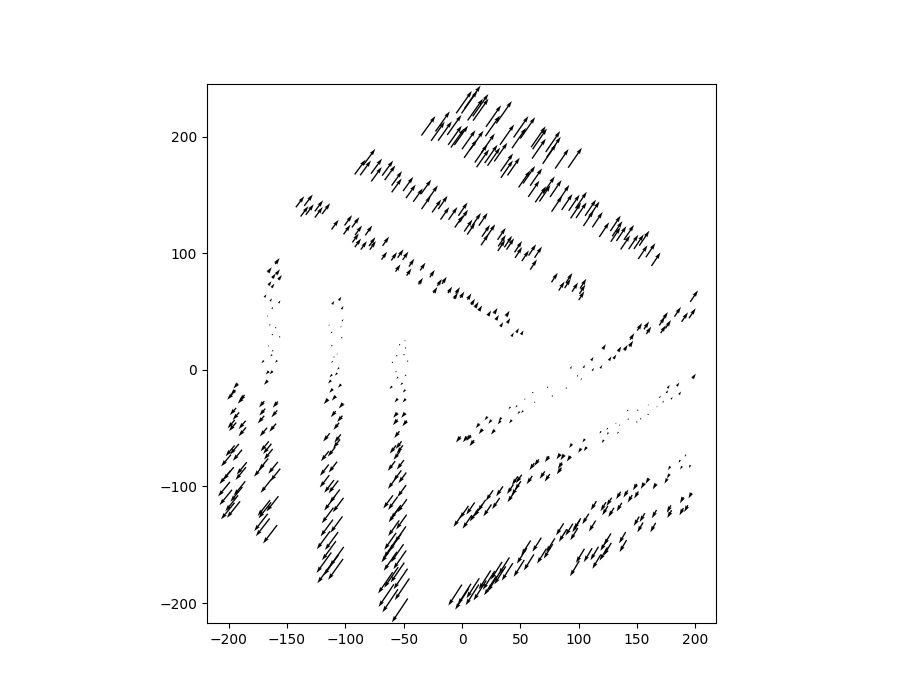

In [ ]:
fq, plq = plt.subplots()
dx = xx2-xx1
dy = yy2-yy1
plq.quiver(xx1, yy1, dx, dy)
plq.set_aspect('equal')
r = np.hypot(dx, dy)
print(np.median(r))

In [ ]:
xx = []
yy = []
for i, d in enumerate(dithers):
    md = d.md
    altitude = md['ALTITUDE']
    pa = md['INST-PA']
    boresight = [[d.ra], [d.dec]]
    utc = f"{md['DATE-OBS']} {md['UT']}"
    x, y = CoordinateTransform(np.stack(([d.ra], [d.dec])),
                                           mode="sky_pfi", za=90.0 - altitude,
                                           pa=pa, cent=boresight, time=utc)[0:2]
    xx.append(x)
    yy.append(y)

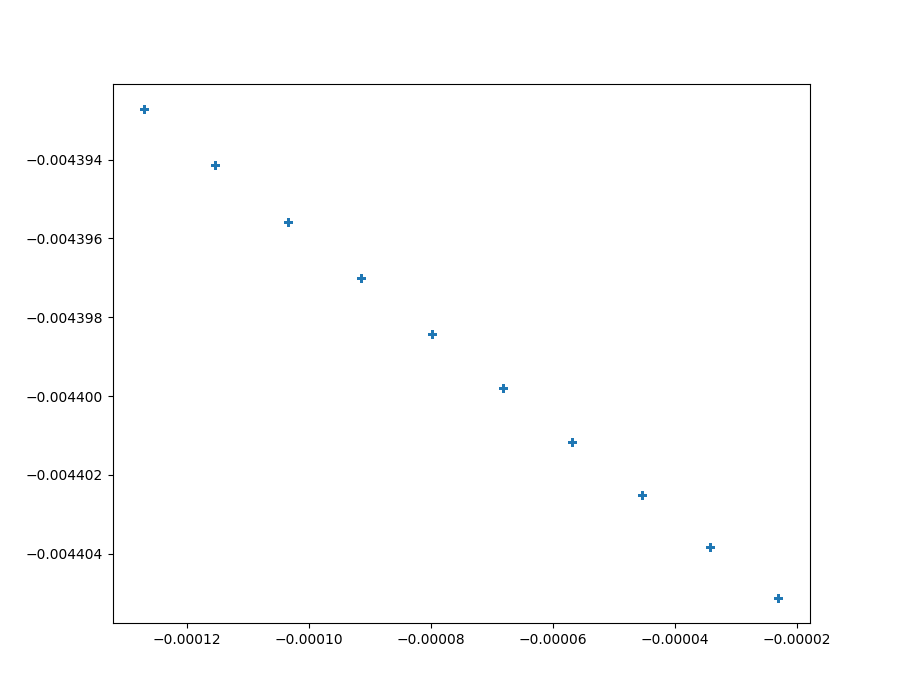

In [ ]:
f, pl = plt.subplots()
pl.plot(3600*xx, 3600*yy, '+')